#Importing libraries and data

In [ ]:
# Exploratory data analysis and plotting libraries
from google.colab import files
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from scipy.io import arff
import warnings
warnings.simplefilter("ignore")
# Models from Scikit-Learn
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
!pip install scikeras
# Deep Learning
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from scikeras.wrappers import KerasClassifier
from keras import regularizers
from sklearn.base import BaseEstimator, ClassifierMixin
from keras.callbacks import EarlyStopping
# Model evaluations
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report, f1_score, precision_score, recall_score, average_precision_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn import preprocessing
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

In [ ]:
uploaded = files.upload()

Saving Maternal Health Risk Data Set.csv to Maternal Health Risk Data Set.csv


In [ ]:
df = pd.read_csv('Maternal Health Risk Data Set.csv')
print(df)

      Age  SystolicBP  DiastolicBP    BS  BodyTemp  HeartRate  RiskLevel
0      25         130           80  15.0      98.0         86  high risk
1      35         140           90  13.0      98.0         70  high risk
2      29          90           70   8.0     100.0         80  high risk
3      30         140           85   7.0      98.0         70  high risk
4      35         120           60   6.1      98.0         76   low risk
...   ...         ...          ...   ...       ...        ...        ...
1009   22         120           60  15.0      98.0         80  high risk
1010   55         120           90  18.0      98.0         60  high risk
1011   35          85           60  19.0      98.0         86  high risk
1012   43         120           90  18.0      98.0         70  high risk
1013   32         120           65   6.0     101.0         76   mid risk

[1014 rows x 7 columns]


#Exploratory data analysis

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1014 entries, 0 to 1013
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Age          1014 non-null   int64  
 1   SystolicBP   1014 non-null   int64  
 2   DiastolicBP  1014 non-null   int64  
 3   BS           1014 non-null   float64
 4   BodyTemp     1014 non-null   float64
 5   HeartRate    1014 non-null   int64  
 6   RiskLevel    1014 non-null   object 
dtypes: float64(2), int64(4), object(1)
memory usage: 55.6+ KB


In [ ]:
df.isna().sum()

Age            0
SystolicBP     0
DiastolicBP    0
BS             0
BodyTemp       0
HeartRate      0
RiskLevel      0
dtype: int64

Non ci sono valori mancanti.

In [ ]:
risk_levels = df["RiskLevel"].value_counts()
print(risk_levels)

low risk     406
mid risk     336
high risk    272
Name: RiskLevel, dtype: int64


In [ ]:
risk_levels_df = pd.DataFrame({"RiskLevel": risk_levels.index, "Count": risk_levels.values})

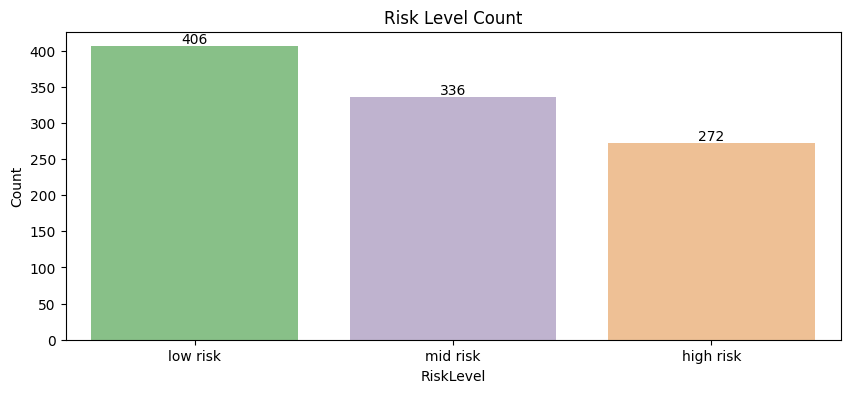

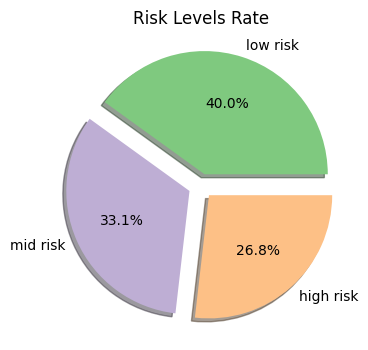

In [ ]:
# Plotting risk level counts
palette = "Accent"
plt.figure(figsize=(10, 4))
ax = sns.barplot(data=risk_levels_df, x="RiskLevel", y="Count", palette=palette)
for container in ax.containers:
    ax.bar_label(container)
plt.title("Risk Level Count")
plt.show()

# Plotting risk level rates
plt.figure(figsize=(10, 4))
plt.pie(x=risk_levels, explode=[0.1, 0.1, 0.1], labels=risk_levels.index,
        colors=plt.get_cmap(palette)(range(len(risk_levels))), autopct="%.1f%%", shadow=True)
plt.title("Risk Levels Rate")
plt.show()

C'è uno sbilanciamento tra i livelli di rischio. In presenza di una forte rappresentanza di una classe rispetto alle altre, il modello potrebbe avere difficoltà a generalizzare bene e a ottenere prestazioni accurate per le classi meno rappresentate. Questo può portare a problemi come il sovra-addestramento sulla classe maggioritaria e la mancata identificazione accurata delle istanze delle classi minoritarie.


In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1014.0,29.871795,13.474386,10.0,19.0,26.0,39.0,70.0
SystolicBP,1014.0,113.198225,18.403913,70.0,100.0,120.0,120.0,160.0
DiastolicBP,1014.0,76.460552,13.885796,49.0,65.0,80.0,90.0,100.0
BS,1014.0,8.725986,3.293532,6.0,6.9,7.5,8.0,19.0
BodyTemp,1014.0,98.665089,1.371384,98.0,98.0,98.0,98.0,103.0
HeartRate,1014.0,74.301775,8.088702,7.0,70.0,76.0,80.0,90.0


Si notano valori anomali nel dataset, in particolare:
* Nella variabile "Età" sono presenti valori non coerenti con l'età fertile (es. 10, 70).
* Nella variabile "Frequenza cardiaca" il minimo è 7, un valore anomalo.  

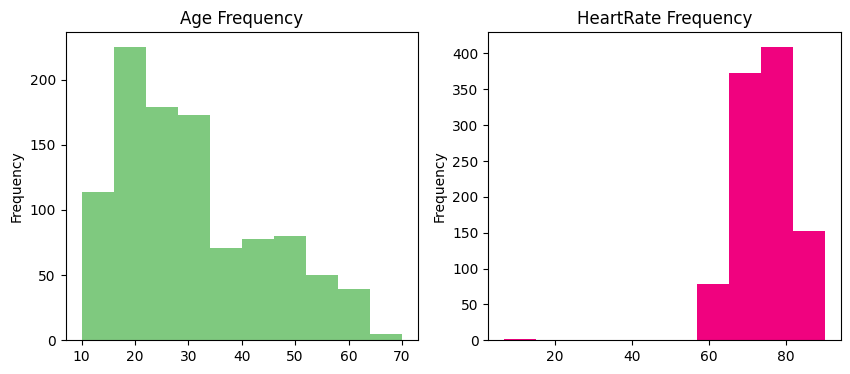

In [ ]:
plt.subplots(1, 2, figsize = (10, 4))
plt.subplot(121)
df.Age.plot.hist(color = "#7FC97F")
plt.title("Age Frequency");

plt.subplot(122)
df.HeartRate.plot.hist(color = "#F0027F")
plt.title("HeartRate Frequency");

* Il valore "7" della "Frequenza cardiaca" è un outlier, probabilmente un errore di inserimento.
* La variabile "Età" resta da approfondire.

In [ ]:
px.box(df.Age, orientation = "h", points = "all")

Il valore "70" può essere considerato un outlier,  mentre il range "10-14" è discutibile.

https://aidos.it/wp-content/uploads/2013/10/UNFPA2013-completo-def.pdf

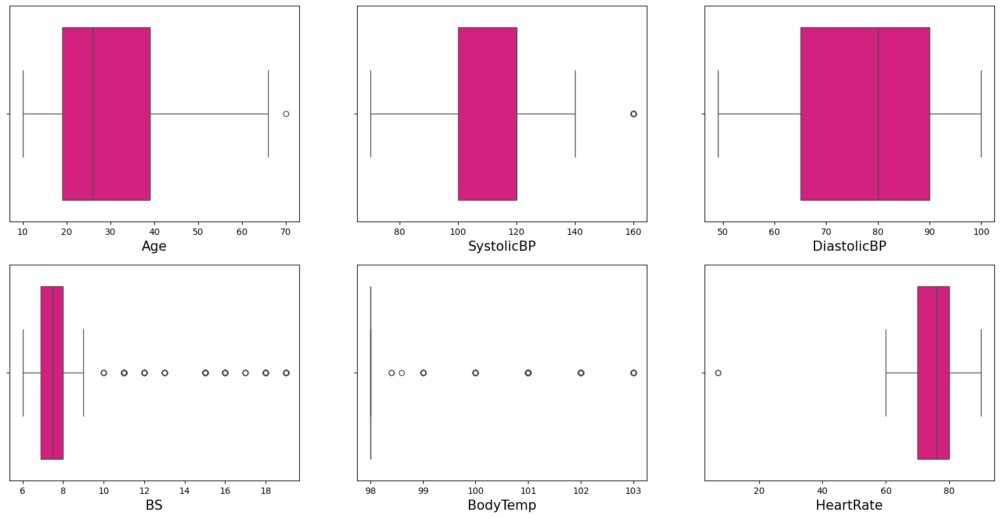

In [ ]:
plt.figure(figsize = (20, 15))
for i, col in enumerate(df.iloc[:, 0:6]):
    plt.subplot(3, 3, i + 1)
    sns.boxplot(data = df.iloc[:, 0:6], x = col, color = "#F0027F")
    plt.xlabel(col, fontsize = 15)
    plt.xticks(fontsize = 10)

La distribuzione generale dell'età sul set di dati è compresa tra 20 e 40 anni. La pressione sistolica è compresa tra 100 e 120 mmHg, la pressione diastolica tra 60 e 90 mmHg, il livello glicemico nel sangue tra 7 e 8 mmol/l, la frequenza cardiaca tra 70 e 80 bpm e la temperatura corporea è per lo più di 98 F (36,6°).

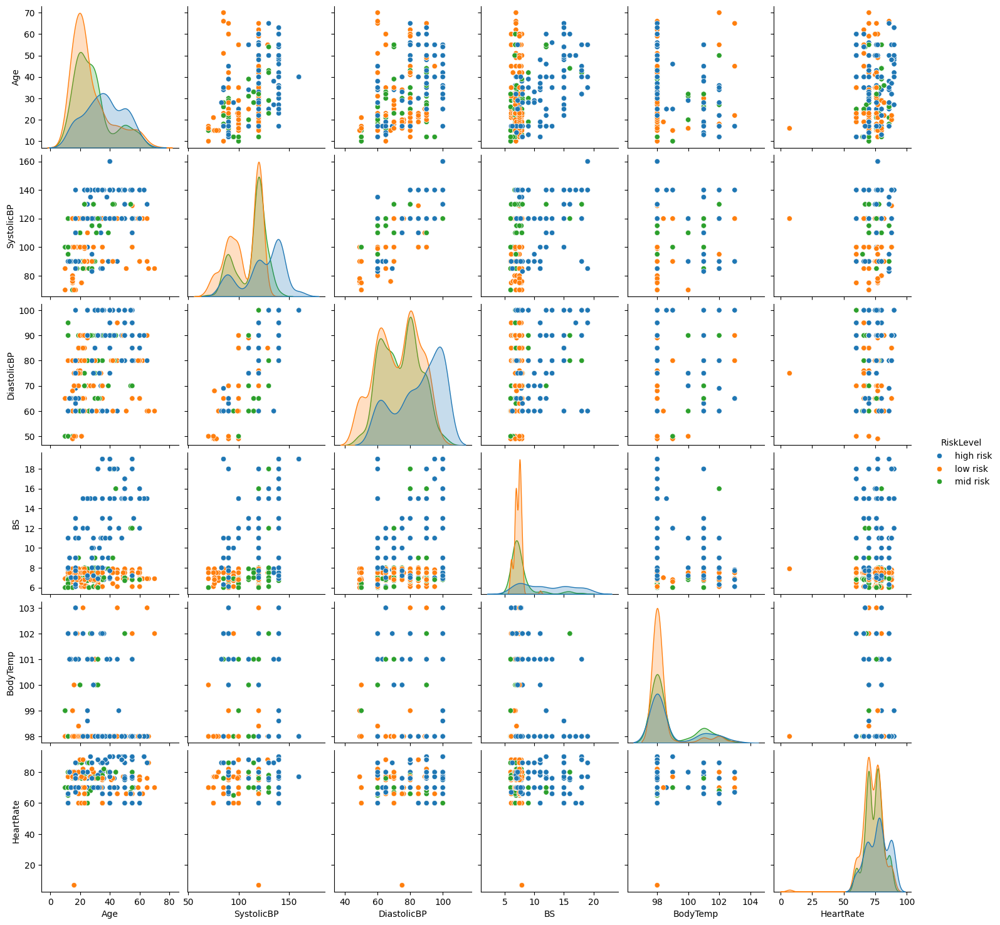

In [ ]:
sns.pairplot(df.iloc[:,:], hue = "RiskLevel");

Analisi bivariata. La matrice è simmetrica.

<Figure size 800x500 with 0 Axes>

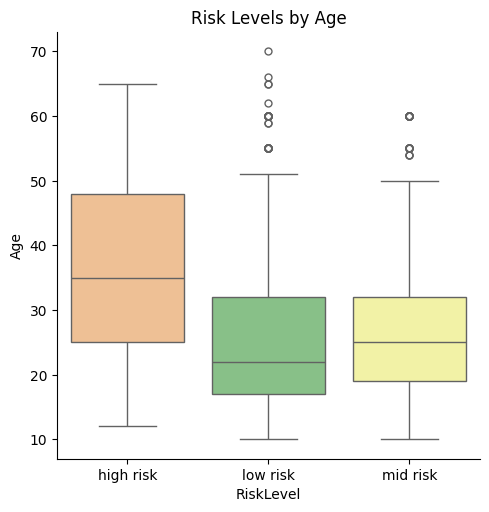

<Figure size 800x500 with 0 Axes>

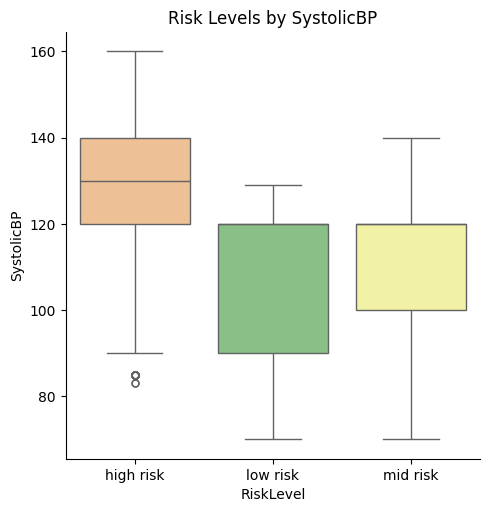

<Figure size 800x500 with 0 Axes>

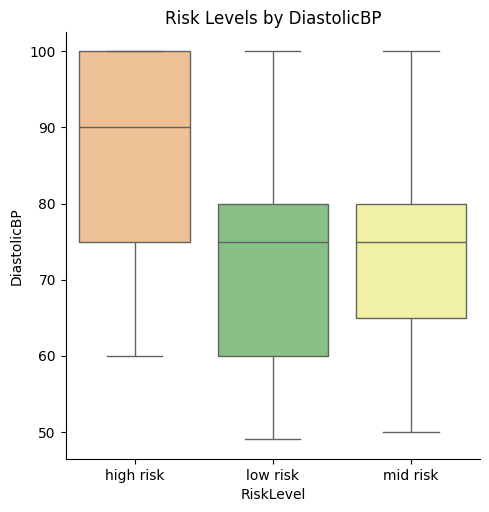

<Figure size 800x500 with 0 Axes>

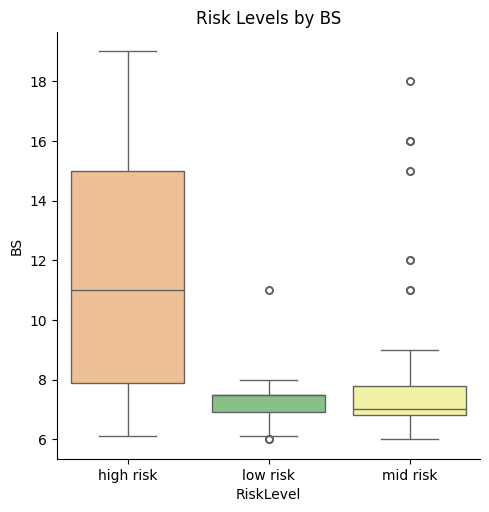

<Figure size 800x500 with 0 Axes>

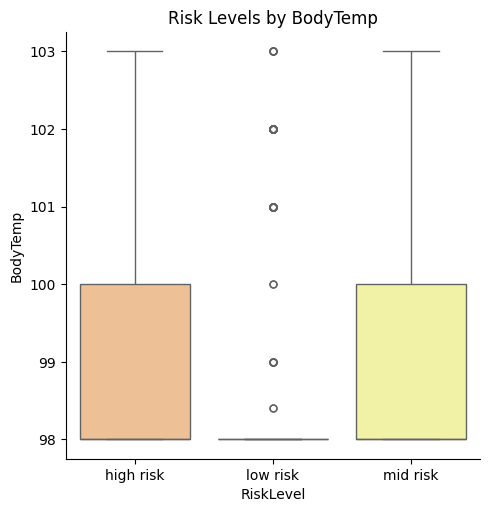

<Figure size 800x500 with 0 Axes>

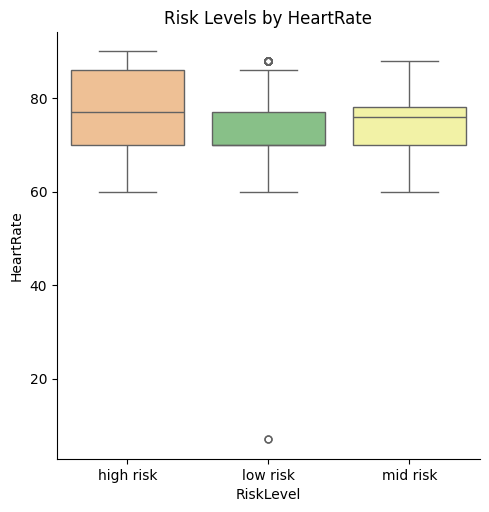

In [ ]:
columns = df.columns[:len(df.columns) - 1]
for i in range(len(columns)):
    plt.figure(figsize = (8, 5))
    sns.catplot(data = df,
                x = "RiskLevel",
                y = columns[i],
                kind = "box",
                palette = ["#FDC086","#7FC97F","#FFFF99"]).set(title = f"Risk Levels by {columns[i]}");

Relazione lineare crescente tra i valori e i livelli di rischio, tranne per la temperatura corporea; la frequenza cardiaca sembra essere determinante per valori oltre una certa soglia.

In [ ]:
# "low risk": 0,
# "mid risk": 1,
# "high risk": 2
risk_map = {"low risk": 0, "mid risk": 1, "high risk": 2}
df["RiskLevel"] = df["RiskLevel"].map(risk_map)
df

,Age,SystolicBP,DiastolicBP,BS,BodyTemp,HeartRate,RiskLevel
0,25,130,80,15.0,98.0,86,2
1,35,140,90,13.0,98.0,70,2
2,29,90,70,8.0,100.0,80,2
3,30,140,85,7.0,98.0,70,2
4,35,120,60,6.1,98.0,76,0
...,...,...,...,...,...,...,...
1009,22,120,60,15.0,98.0,80,2
1010,55,120,90,18.0,98.0,60,2
1011,35,85,60,19.0,98.0,86,2
1012,43,120,90,18.0,98.0,70,2


(7.5, -0.5)

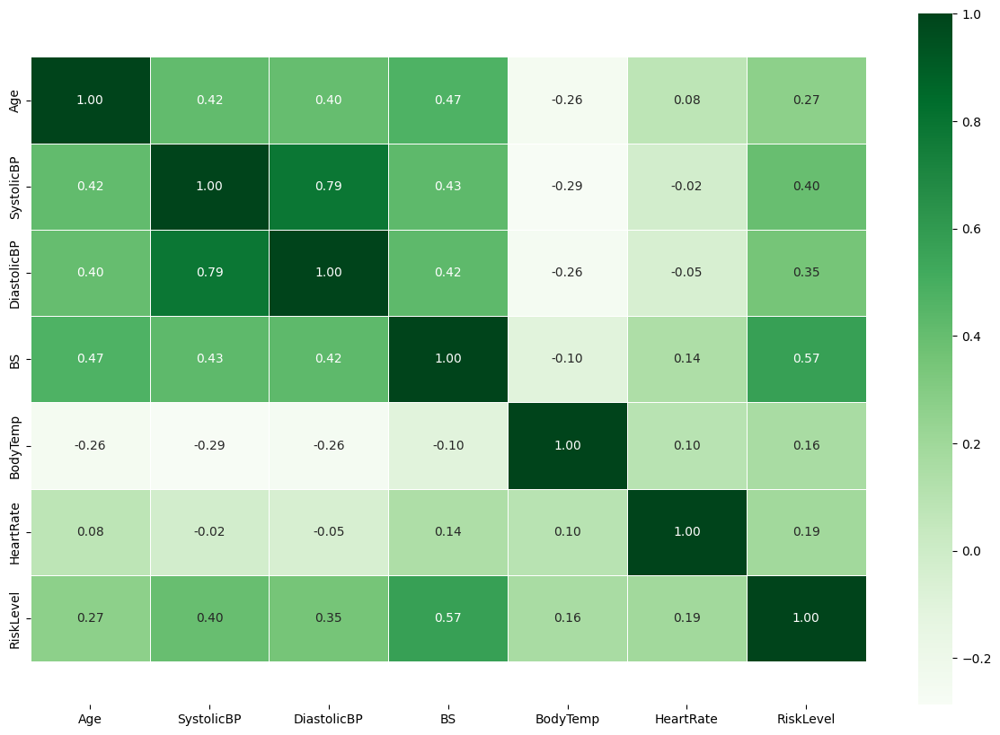

In [ ]:
corr_matrix = df.corr()
fig, ax = plt.subplots(figsize = (15, 10))
ax = sns.heatmap(corr_matrix,
                 annot = True,
                 linewidths = 0.5,
                 fmt = ".2f",
                 cmap = "Greens");
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

La matrice di correlazione dice che DiastolicBP e SystolicBP sono altamente correlati tra loro. I valori della pressione sanguigna e della glicemia sono correlati all'età. Anche il livello di rischio dipende principalmente dalla glicemia, poi dai valori della pressione sanguigna e dall'età. La frequenza cardiaca, la temperatura corporea e l'età sono caratteristiche meno efficaci a livello di rischio qui.

#Data preprocessing

In [ ]:
# Modify outliers heart rate
df['HeartRate'] = df['HeartRate'].replace(7, 70)

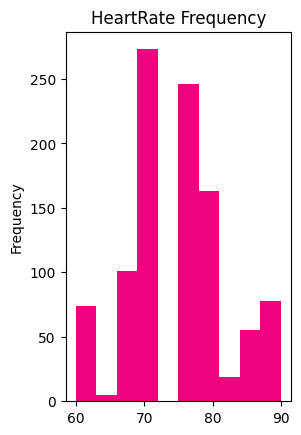

In [ ]:
plt.subplot(122)
df.HeartRate.plot.hist(color = "#F0027F")
plt.title("HeartRate Frequency");

In [ ]:
# Modify outliers age
df = df[~((df["Age"] == 70))]

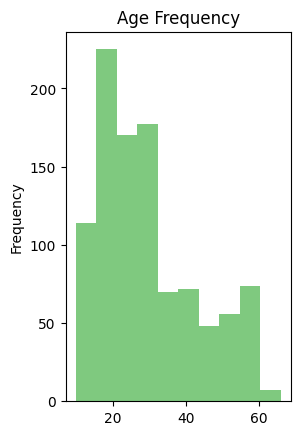

In [ ]:
plt.subplot(121)
df.Age.plot.hist(color = "#7FC97F")
plt.title("Age Frequency");

In [ ]:
# Split data into features and target
X = df.drop(["RiskLevel"], axis = 1)
y = df["RiskLevel"]

In [ ]:
X

,Age,SystolicBP,DiastolicBP,BS,BodyTemp,HeartRate
0,25,130,80,15.0,98.0,86
1,35,140,90,13.0,98.0,70
2,29,90,70,8.0,100.0,80
3,30,140,85,7.0,98.0,70
4,35,120,60,6.1,98.0,76
...,...,...,...,...,...,...
1009,22,120,60,15.0,98.0,80
1010,55,120,90,18.0,98.0,60
1011,35,85,60,19.0,98.0,86
1012,43,120,90,18.0,98.0,70


In [ ]:
y

0       2
1       2
2       2
3       2
4       0
       ..
1009    2
1010    2
1011    2
1012    2
1013    1
Name: RiskLevel, Length: 1013, dtype: int64

#Modelling

##Logistic Regression Classifier

In [ ]:
"""
Dividiamo il dataset in 3 parti:
- Set di addestramento (X_train, y_train),
- Set di Cross-Validation (X_cv, y_cv)
- Set di test (X_test, y_test).
Il 60% del dataset sarà utilizzato come set di training, il 20% come set di CV e il restante 20% come test set.

"""
X_train, x_, y_train, y_ = train_test_split(X, y, test_size=0.40, random_state=1)
X_cv, X_test, y_cv, y_test = train_test_split(x_, y_, test_size=0.50, random_state=1)

# Delete temporary variables
del x_, y_

print(f"the shape of the training set (input) is: {X_train.shape}")
print(f"the shape of the training set (target) is: {y_train.shape}\n")
print(f"the shape of the cross validation set (input) is: {X_cv.shape}")
print(f"the shape of the cross validation set (target) is: {y_cv.shape}\n")
print(f"the shape of the test set (input) is: {X_test.shape}")
print(f"the shape of the test set (target) is: {y_test.shape}")

the shape of the training set (input) is: (607, 6)
the shape of the training set (target) is: (607,)

the shape of the cross validation set (input) is: (203, 6)
the shape of the cross validation set (target) is: (203,)

the shape of the test set (input) is: (203, 6)
the shape of the test set (target) is: (203,)


In [ ]:
# Standardization Z-score
scaler = preprocessing.StandardScaler()
X_trainStandart = scaler.fit_transform(X_train)
X_cvStandart = scaler.transform(X_cv)
X_testStandart = scaler.transform(X_test)

In [ ]:
# Baseline LR with Scikit
logistic_regression = linear_model.LogisticRegression()
logistic_regression.fit(X_trainStandart, y_train)
pred_logistic_regression = logistic_regression.predict(X_testStandart)
print("Prediction on training set:", pred_logistic_regression)
print(f"Accuracy on test set: {round(logistic_regression.score(X_testStandart, y_test), 3)}")

Prediction on training set: [2 0 1 1 0 0 0 0 2 0 1 1 1 2 0 1 0 2 1 2 2 2 2 1 1 2 0 0 2 0 0 1 1 0 1 1 0
 2 0 2 2 1 2 0 2 0 2 0 0 0 2 2 0 2 0 1 0 2 1 0 0 0 0 2 2 0 0 0 1 0 1 0 1 1
 0 1 0 0 0 0 0 2 1 1 0 2 0 0 0 1 2 1 0 0 2 2 2 0 0 0 0 2 1 0 0 1 0 0 0 0 0
 0 0 1 2 0 1 2 1 2 0 1 1 0 0 0 2 2 0 0 1 0 0 0 2 0 1 0 0 2 0 1 2 2 0 0 1 0
 0 1 0 0 1 0 0 0 2 0 0 0 2 1 0 0 0 1 1 0 0 0 1 0 0 0 0 0 2 1 1 2 0 0 2 1 0
 0 2 1 0 1 2 0 1 1 1 0 2 0 0 1 1 0 0]
Accuracy on test set: 0.601


In [ ]:
"""
Utilizziamo la GridSearch per la ricerca degli iperparametri del modello di Regressione Logistica,
definendo i range di valori da testare.

"""
params_LR = {"tol": [0.0001,0.0002,0.0003],
            "C": [0.01, 0.1, 1, 10, 100],
            "penalty": ['l1', 'l2'],
            "intercept_scaling": [1, 2, 3, 4],
            "solver": ["liblinear", "lbfgs", "newton-cg"],
            "max_iter": [100, 200, 300],
              }


I parametri per la ricerca degli iperparametri sono i seguenti:

* "tol": Tolleranza per la convergenza. Valori più piccoli indicano una maggiore precisione, ma possono richiedere più tempo per convergere.
* "C": Inverso della forza di regolarizzazione. Valori più piccoli indicano una maggiore regolarizzazione (previene l'overfitting).
* "intercept_scaling": Scala per la penalizzazione dell'intercetta. Può influire sulla convergenza del modello.
* "solver": Algoritmo da utilizzare nel problema di ottimizzazione. I valori possibili includono "liblinear", "lbfgs", e "newton-cg".
* "max_iter": Numero massimo di iterazioni per la convergenza.

In [ ]:
# GridSearchCV initialization
GridSearchCV_LR = GridSearchCV(estimator=linear_model.LogisticRegression(),
                                param_grid=params_LR,
                                cv=3,
                                scoring = "accuracy")
# Fit model with train data
GridSearchCV_LR.fit(X_trainStandart, y_train);

# Best model
best_model_LR = GridSearchCV_LR.best_estimator_

In [ ]:
print(f"Best estimator for LR model:\n{GridSearchCV_LR.best_estimator_}")
print(f"Best parameter values for LR model:\n{GridSearchCV_LR.best_params_}")
print(f"Best score for LR model: {round(GridSearchCV_LR.best_score_, 3)}")

Best estimator for LR model:
LogisticRegression(C=0.1)
Best parameter values for LR model:
{'C': 0.1, 'intercept_scaling': 1, 'max_iter': 100, 'penalty': 'l2', 'solver': 'lbfgs', 'tol': 0.0001}
Best score for LR model: 0.641


In [ ]:
# Predictions
train_pred_LR = best_model_LR.predict(X_trainStandart)
cv_pred_LR = best_model_LR.predict(X_cvStandart)
test_pred_LR = best_model_LR.predict(X_testStandart)

# Calculate accuracy for each set
train_acc_LR = accuracy_score(y_train, train_pred_LR)
cv_acc_LR = accuracy_score(y_cv, cv_pred_LR)
test_acc_LR = accuracy_score(y_test, test_pred_LR)

# Print the results
print(f"Best Model: {best_model_LR}")
print(f"Training Set Accuracy: {train_acc_LR:.4f}")
print(f"CV Set Accuracy: {cv_acc_LR:.4f}")
print(f"Test Set Accuracy: {test_acc_LR:.4f}")

Best Model: LogisticRegression(C=0.1)
Training Set Accuracy: 0.6590
CV Set Accuracy: 0.6158
Test Set Accuracy: 0.5911


In [ ]:
# Print Classification Report & Confusion Matrix
print("Classification Report")
print(classification_report(y_test, test_pred_LR))
print("Confusion Matrix:")
print(confusion_matrix(y_test, test_pred_LR))

Classification Report
              precision    recall  f1-score   support

           0       0.60      0.82      0.70        79
           1       0.39      0.31      0.35        64
           2       0.80      0.58      0.67        60

    accuracy                           0.59       203
   macro avg       0.60      0.57      0.57       203
weighted avg       0.59      0.59      0.58       203

Confusion Matrix:
[[65 13  1]
 [36 20  8]
 [ 7 18 35]]


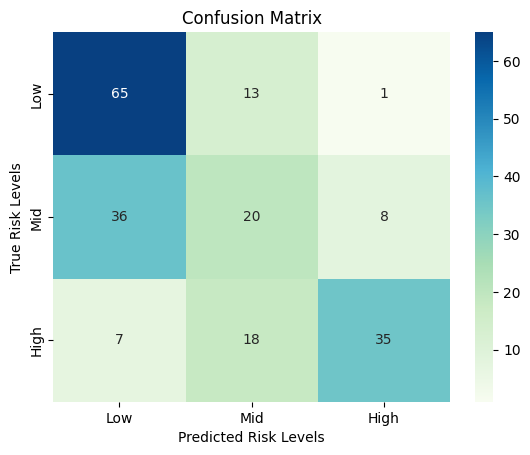

In [ ]:
ax= plt.subplot()
lr_cm = confusion_matrix(y_test, test_pred_LR)
sns.heatmap(lr_cm, annot=True, ax=ax, cmap="GnBu", fmt='d')
ax.set_xlabel("Predicted Risk Levels");
ax.set_ylabel("True Risk Levels");
ax.set_title("Confusion Matrix");
ax.xaxis.set_ticklabels(["Low", "Mid", "High"]);
ax.yaxis.set_ticklabels(["Low", "Mid", "High"]);

##Deep Learning Tensorflow 2l



In [ ]:
"""
Dividiamo il dataset in due parti:
- Set di addestramento (X_train, y_train),
- Set di test (X_test, y_test).
Il 20% del dataset sarà utilizzato come set di test per renderlo confrontabile con il test set
della Regressione Logistica, mentre il restante 80% sarà usato come set di addestramento.

"""
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)
# Standardization Z-score
scaler = preprocessing.StandardScaler()
X_trainStandart = scaler.fit_transform(X_train)
X_testStandart = scaler.transform(X_test)

"""
Creiamo un modello di rete neurale utilizzando Keras e Tensorflow per poi utilizzare
la GridSearchCV per trovare i migliori iperparametri per questo modello.
L'architettura del modello include strati nascosti seguiti da uno strato di dropout per ridurre l'overfitting.

"""
# Create Model for GridSearchCV with Dense layers
def create_model(neurons_1, epochs=400, activation='relu'):
    model = keras.models.Sequential()
    model.add(keras.layers.Dense(units=neurons_1, input_shape=(X_trainStandart.shape[1],), activation=activation))
    model.add(keras.layers.Dropout(rate=0.2))
    model.add(keras.layers.Dense(units=3, activation='linear'))
    model.compile(optimizer=tf.keras.optimizers.Adam(0.01), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
    early_stopping = EarlyStopping(monitor='loss', patience=3, verbose=1, restore_best_weights=True, mode='min')
    return model

params= dict(neurons_1 = [20,50,100])
# Creation of KerasClassifier wrapper for Scikit-learn
model = KerasClassifier(build_fn=create_model, neurons_1=[20,50,100], epochs=400)
gs = GridSearchCV(estimator=model, param_grid=params, scoring='accuracy', cv=3)
gs_results = gs.fit(X_trainStandart, y_train)
print(gs_results.best_score_, gs_results.best_params_)

Epoch 1/400


Exception ignored in: <function _xla_gc_callback at 0x7ba6a91ea4d0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/jax/_src/lib/__init__.py", line 97, in _xla_gc_callback
    def _xla_gc_callback(*args):
KeyboardInterrupt: 


Output streaming troncato alle ultime 5000 righe.
34/34 [==============================] - 0s 3ms/step - loss: 0.4918 - accuracy: 0.7596
Epoch 305/400
34/34 [==============================] - 0s 4ms/step - loss: 0.4699 - accuracy: 0.7838
Epoch 306/400
34/34 [==============================] - 0s 4ms/step - loss: 0.4682 - accuracy: 0.7968
Epoch 307/400
34/34 [==============================] - 0s 4ms/step - loss: 0.4828 - accuracy: 0.7689
Epoch 308/400
34/34 [==============================] - 0s 3ms/step - loss: 0.4884 - accuracy: 0.7661
Epoch 309/400
34/34 [==============================] - 0s 3ms/step - loss: 0.4982 - accuracy: 0.7642
Epoch 310/400
34/34 [==============================] - 0s 5ms/step - loss: 0.4765 - accuracy: 0.7773
Epoch 311/400
34/34 [==============================] - 0s 4ms/step - loss: 0.4823 - accuracy: 0.7679
Epoch 312/400
34/34 [==============================] - 0s 4ms/step - loss: 0.4750 - accuracy: 0.7773
Epoch 313/400
34/34 [==============================] - 

In [ ]:
# Model creation
best_model = gs_results.best_estimator_.model_
best_model.summary()

Model: "sequential_204"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_542 (Dense)           (None, 50)                350       
                                                                 
 dropout_338 (Dropout)       (None, 50)                0         
                                                                 
 dense_543 (Dense)           (None, 3)                 153       
                                                                 
Total params: 503 (1.96 KB)
Trainable params: 503 (1.96 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch 1/400
41/41 [==============================] - 1s 7ms/step - loss: 0.4716 - accuracy: 0.7880 - val_loss: 0.4206 - val_accuracy: 0.8168
Epoch 2/400
41/41 [==============================] - 0s 3ms/step - loss: 0.4458 - accuracy: 0.7943 - val_loss: 0.4255 - val_accuracy: 0.8075
Epoch 3/400
41/41 [==============================] - 0s 3ms/step - loss: 0.4561 - accuracy: 0.7834 - val_loss: 0.4282 - val_accuracy: 0.8199
Epoch 4/400
41/41 [==============================] - 0s 4ms/step - loss: 0.4636 - accuracy: 0.7873 - val_loss: 0.4132 - val_accuracy: 0.8478
Epoch 5/400
41/41 [==============================] - 0s 3ms/step - loss: 0.4633 - accuracy: 0.7826 - val_loss: 0.4195 - val_accuracy: 0.8292
Epoch 6/400
41/41 [==============================] - 0s 3ms/step - loss: 0.4494 - accuracy: 0.7896 - val_loss: 0.4320 - val_accuracy: 0.8106
Epoch 7/400
41/41 [==============================] - 0s 6ms/step - loss: 0.4630 - accuracy: 0.7787 - val_loss: 0.4482 - val_accuracy: 0.7888
Epoch 8/400
4

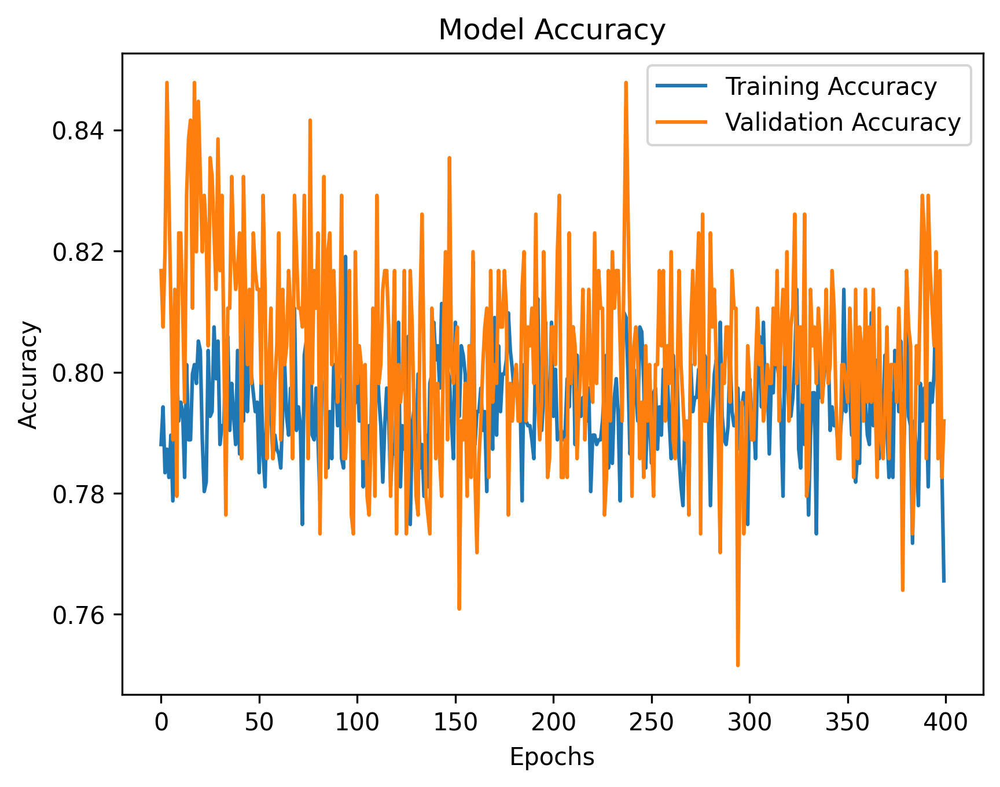

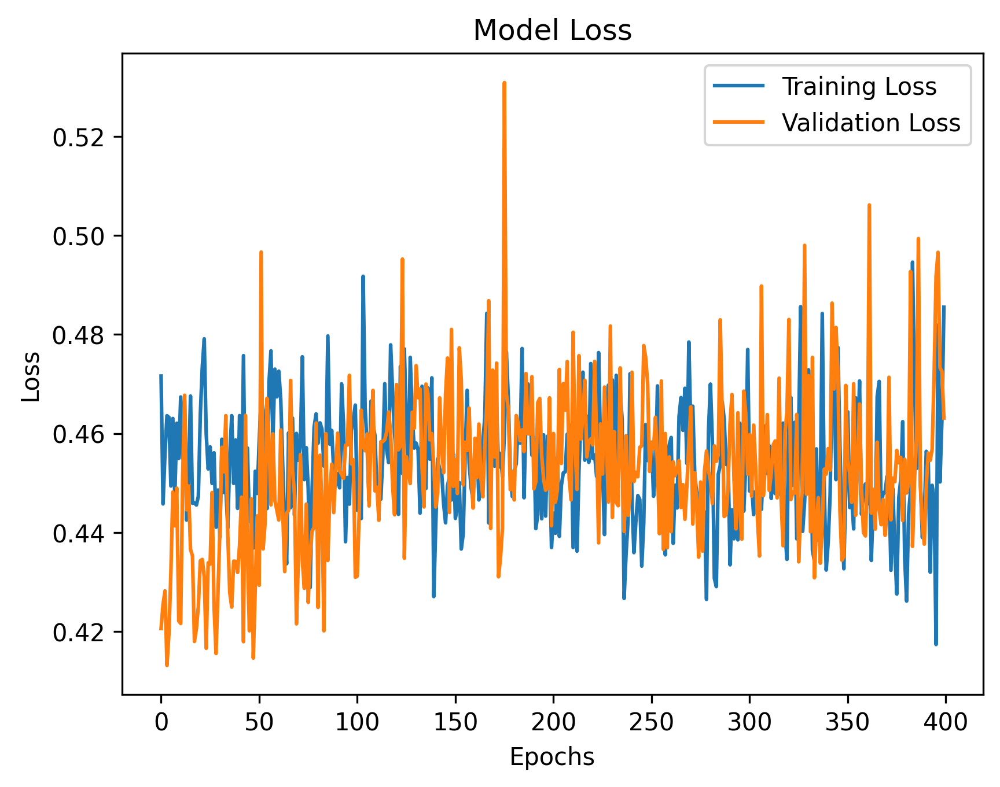

In [ ]:
# Example of model training and history recovery
history = best_model.fit(X_trainStandart, y_train, validation_split=0.20, epochs = 400, verbose=1)

# Plot of accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.rcParams['figure.dpi'] = 300
plt.show()

# Plot of loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.rcParams['figure.dpi'] = 300
plt.show()

In [ ]:
# Calculate accuracy for each set
dl_acc_tr = best_model.evaluate(X_trainStandart, y_train)[1]
print("Deep Learning Training Accuracy:", dl_acc_tr)
dl_acc = best_model.evaluate(X_testStandart, y_test)[1]
print("Deep Learning Model Accuracy:", dl_acc)

51/51 [==============================] - 0s 2ms/step - loss: 0.4170 - accuracy: 0.8050
Deep Learning Training Accuracy: 0.8049689531326294
13/13 [==============================] - 0s 2ms/step - loss: 0.4917 - accuracy: 0.8114
Deep Learning Model Accuracy: 0.8114144206047058


In [ ]:
# Predictions as score
"""
Si effettuano previsioni utilizzando il modello migliore sui dati standardizzati.
Come output otteniamo i logits delle previsioni, un range di valori non probabilistici;
successivamente elaboriamo attraverso la Softmax i risultati convertendo i valori
in una distribuzione di probabilità.

"""

dl_pred_logits = best_model.predict(X_testStandart)
print(f"two example output vectors:\n {dl_pred_logits[:2]}")
print("largest value", np.max(dl_pred_logits), "smallest value", np.min(dl_pred_logits))

13/13 [==============================] - 0s 2ms/step
two example output vectors:
 [[  1.8321244    0.48193944 -42.351246  ]
 [-13.430233    -5.7738714    3.027189  ]]
largest value 178.247 smallest value -562.087


In [ ]:
# Predictions as probability
dl_pred_prob = tf.nn.softmax(dl_pred_logits).numpy()
print(f"two example output vectors:\n {dl_pred_prob[:2]}")
print("largest value", np.max(dl_pred_prob), "smallest value", np.min(dl_pred_prob))

two example output vectors:
 [[7.9415983e-01 2.0584013e-01 5.1441629e-20]
 [7.1214252e-08 1.5055059e-04 9.9984932e-01]]
largest value 1.0 smallest value 0.0


In [ ]:
# The most likely class for each output vector
dl_pred = np.argmax(dl_pred_prob, axis=1)

In [ ]:
# Classification Report & Confusion Matrix
print("Deep Learning Classification Report\n\n", classification_report(y_test, dl_pred))

Deep Learning Classification Report

               precision    recall  f1-score   support

           0       0.79      0.92      0.85       159
           1       0.78      0.60      0.68       114
           2       0.85      0.86      0.86       130

    accuracy                           0.81       403
   macro avg       0.81      0.79      0.80       403
weighted avg       0.81      0.81      0.81       403



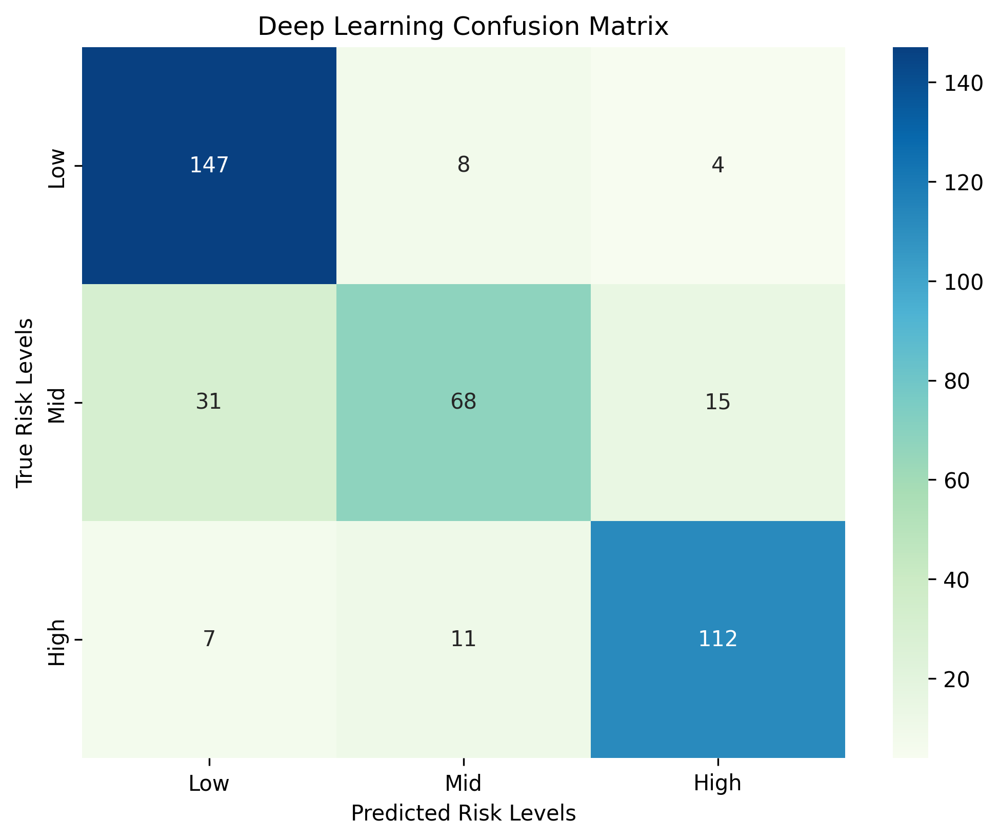

In [ ]:
dl_cm = confusion_matrix(y_test, dl_pred, labels=np.arange(0, 3))

# Plot
plt.figure(figsize=(8, 6))
ax = sns.heatmap(dl_cm, annot=True, cmap="GnBu", fmt='d')
ax.set_xlabel("Predicted Risk Levels")
ax.set_ylabel("True Risk Levels")
ax.set_title("Deep Learning Confusion Matrix")
ax.xaxis.set_ticklabels(["Low", "Mid", "High"])
ax.yaxis.set_ticklabels(["Low", "Mid", "High"])
plt.show()

##Deep Learning Tensorflow 2l



In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)
# Standardization Z-score
scaler = preprocessing.StandardScaler()
X_trainStandart = scaler.fit_transform(X_train)
X_testStandart = scaler.transform(X_test)

# Create Model for GridSearchCV with Dense layers
def create_model(neurons_1, epochs=400, activation='relu'):
    model = keras.models.Sequential()
    model.add(keras.layers.Dense(units=neurons_1, input_shape=(X_trainStandart.shape[1],), activation=activation))
    model.add(keras.layers.Dropout(rate=0.2))
    model.add(keras.layers.Dense(units=3, activation='linear'))
    model.compile(optimizer=tf.keras.optimizers.Adam(0.01), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
    early_stopping = EarlyStopping(monitor='loss', patience=3, verbose=1, restore_best_weights=True, mode='min')
    return model

params= dict(neurons_1 = [35,50,65])
# Creation of KerasClassifier wrapper for Scikit-learn
model = KerasClassifier(build_fn=create_model, neurons_1=[35,50,65], epochs=400)
gs = GridSearchCV(estimator=model, param_grid=params, scoring='accuracy', cv=3)
gs_results = gs.fit(X_trainStandart, y_train)
print(gs_results.best_score_, gs_results.best_params_)

Output streaming troncato alle ultime 5000 righe.
34/34 [==============================] - 0s 3ms/step - loss: 0.4871 - accuracy: 0.7670
Epoch 305/400
34/34 [==============================] - 0s 3ms/step - loss: 0.4703 - accuracy: 0.7754
Epoch 306/400
34/34 [==============================] - 0s 3ms/step - loss: 0.4728 - accuracy: 0.7866
Epoch 307/400
34/34 [==============================] - 0s 3ms/step - loss: 0.4800 - accuracy: 0.7838
Epoch 308/400
34/34 [==============================] - 0s 3ms/step - loss: 0.4783 - accuracy: 0.7884
Epoch 309/400
34/34 [==============================] - 0s 3ms/step - loss: 0.4886 - accuracy: 0.7782
Epoch 310/400
34/34 [==============================] - 0s 3ms/step - loss: 0.4729 - accuracy: 0.7745
Epoch 311/400
34/34 [==============================] - 0s 3ms/step - loss: 0.4701 - accuracy: 0.7801
Epoch 312/400
34/34 [==============================] - 0s 3ms/step - loss: 0.4897 - accuracy: 0.7773
Epoch 313/400
34/34 [==============================] - 

In [ ]:
# Model creation
best_model = gs_results.best_estimator_.model_
best_model.summary()

Model: "sequential_214"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_562 (Dense)           (None, 65)                455       
                                                                 
 dropout_348 (Dropout)       (None, 65)                0         
                                                                 
 dense_563 (Dense)           (None, 3)                 198       
                                                                 
Total params: 653 (2.55 KB)
Trainable params: 653 (2.55 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch 1/400
41/41 [==============================] - 1s 7ms/step - loss: 0.4494 - accuracy: 0.7989 - val_loss: 0.4299 - val_accuracy: 0.8106
Epoch 2/400
41/41 [==============================] - 0s 3ms/step - loss: 0.4572 - accuracy: 0.7873 - val_loss: 0.4197 - val_accuracy: 0.7950
Epoch 3/400
41/41 [==============================] - 0s 3ms/step - loss: 0.4662 - accuracy: 0.7904 - val_loss: 0.4124 - val_accuracy: 0.8354
Epoch 4/400
41/41 [==============================] - 0s 3ms/step - loss: 0.4591 - accuracy: 0.7981 - val_loss: 0.4451 - val_accuracy: 0.7981
Epoch 5/400
41/41 [==============================] - 0s 3ms/step - loss: 0.4636 - accuracy: 0.7842 - val_loss: 0.4319 - val_accuracy: 0.8199
Epoch 6/400
41/41 [==============================] - 0s 3ms/step - loss: 0.4489 - accuracy: 0.7943 - val_loss: 0.4149 - val_accuracy: 0.8106
Epoch 7/400
41/41 [==============================] - 0s 4ms/step - loss: 0.4567 - accuracy: 0.7803 - val_loss: 0.4337 - val_accuracy: 0.8137
Epoch 8/400
4

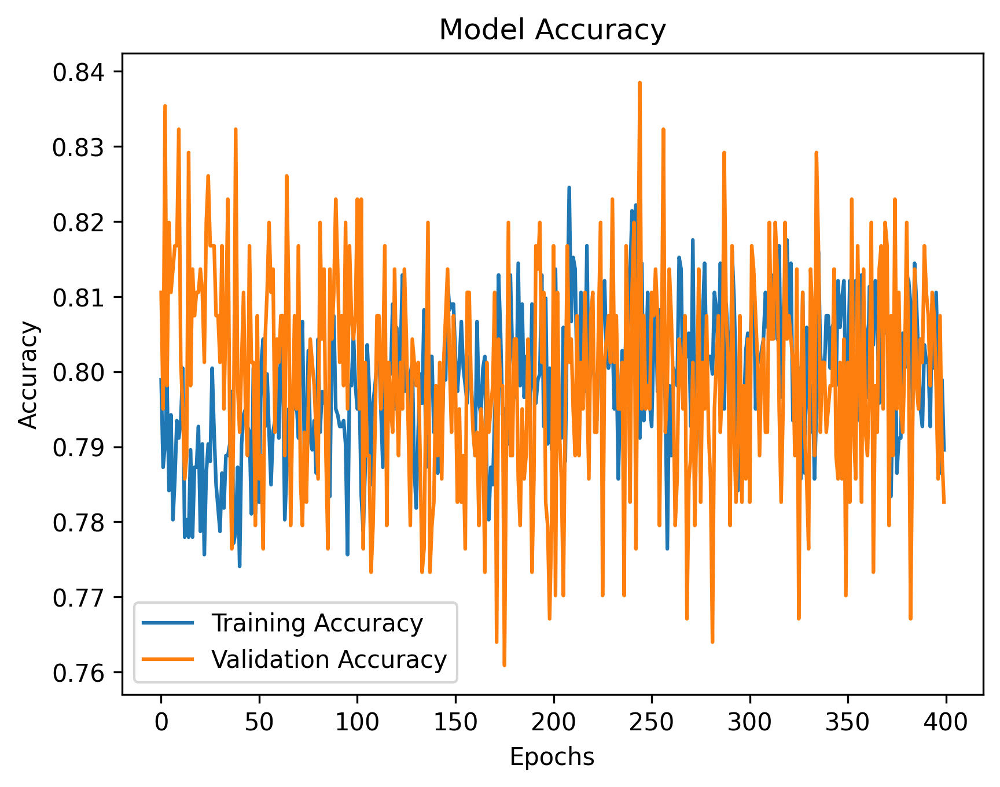

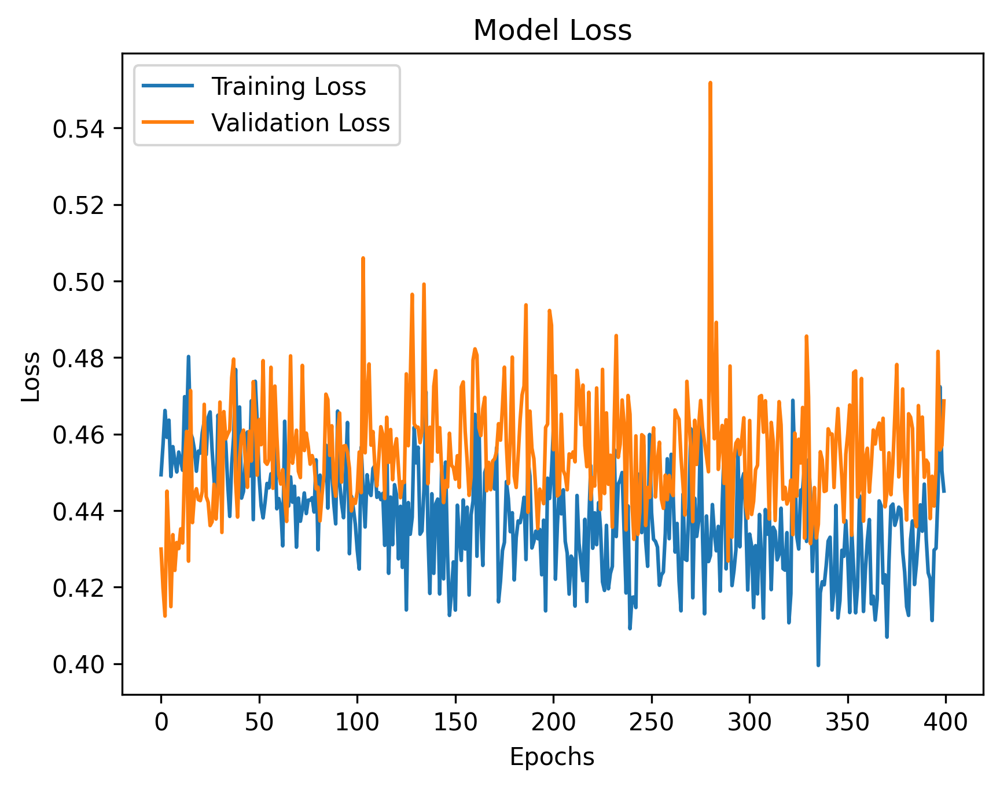

In [ ]:
# Example of model training and history recovery
history = best_model.fit(X_trainStandart, y_train, validation_split=0.20, epochs = 400, verbose=1)

# Plot of accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.rcParams['figure.dpi'] = 300
plt.show()

# Plot of loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.rcParams['figure.dpi'] = 300
plt.show()

In [ ]:
# Calculate accuracy for each set
dl_acc_tr = best_model.evaluate(X_trainStandart, y_train)[1]
print("Deep Learning Training Accuracy:", dl_acc_tr)
dl_acc = best_model.evaluate(X_testStandart, y_test)[1]
print("Deep Learning Model Accuracy:", dl_acc)

51/51 [==============================] - 0s 2ms/step - loss: 0.3897 - accuracy: 0.8379
Deep Learning Training Accuracy: 0.8378881812095642
13/13 [==============================] - 0s 2ms/step - loss: 0.5439 - accuracy: 0.8015
Deep Learning Model Accuracy: 0.8014888167381287


In [ ]:
# Predictions as score
dl_pred_logits = best_model.predict(X_testStandart)
print(f"two example output vectors:\n {dl_pred_logits[:2]}")
print("largest value", np.max(dl_pred_logits), "smallest value", np.min(dl_pred_logits))

13/13 [==============================] - 0s 2ms/step
two example output vectors:
 [[  0.75975937   1.38099    -30.135305  ]
 [-10.76886      0.04809427  -0.10410279]]
largest value 167.05312 smallest value -678.42096


In [ ]:
# Predictions as probability
dl_pred_prob = tf.nn.softmax(dl_pred_logits).numpy()
print(f"two example output vectors:\n {dl_pred_prob[:2]}")
print("largest value", np.max(dl_pred_prob), "smallest value", np.min(dl_pred_prob))

two example output vectors:
 [[3.4950164e-01 6.5049845e-01 1.3362651e-14]
 [1.0789839e-05 5.3797019e-01 4.6201903e-01]]
largest value 1.0 smallest value 0.0


In [ ]:
# The most likely class for each output vector
dl_pred = np.argmax(dl_pred_prob, axis=1)

In [ ]:
# Classification Report & Confusion Matrix
print("Deep Learning Classification Report\n\n", classification_report(y_test, dl_pred))

Deep Learning Classification Report

               precision    recall  f1-score   support

           0       0.82      0.83      0.83       159
           1       0.69      0.76      0.72       114
           2       0.90      0.80      0.85       130

    accuracy                           0.80       403
   macro avg       0.80      0.80      0.80       403
weighted avg       0.81      0.80      0.80       403



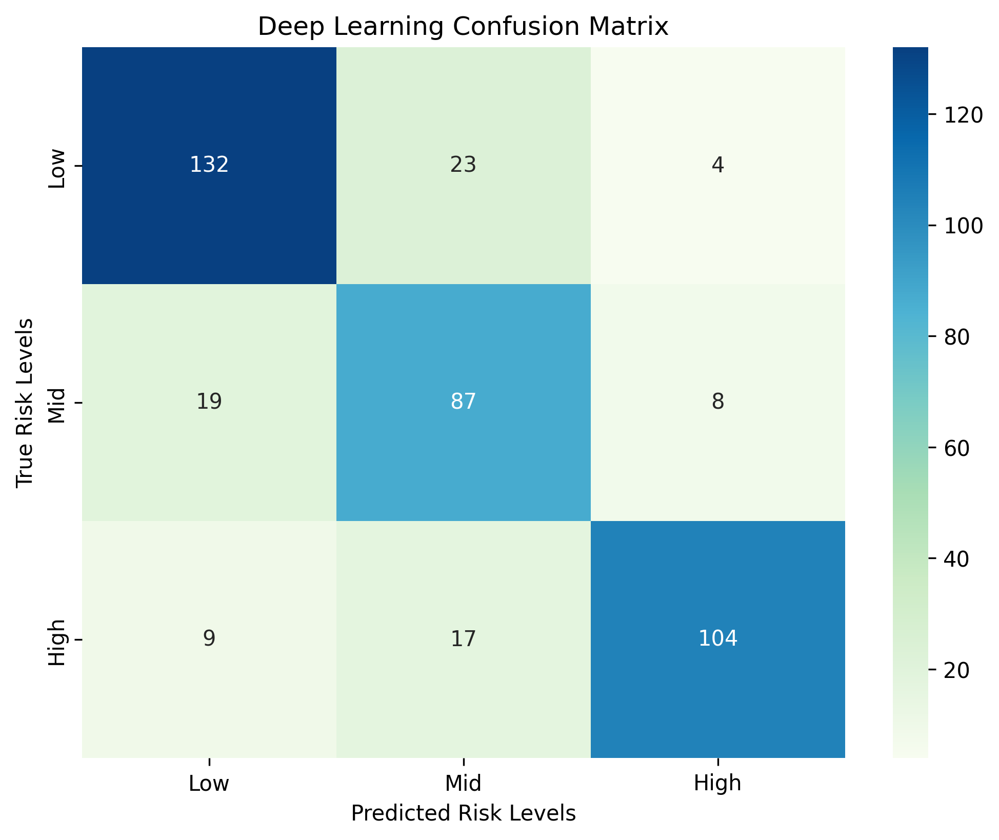

In [ ]:
dl_cm = confusion_matrix(y_test, dl_pred, labels=np.arange(0, 3))

# Plot
plt.figure(figsize=(8, 6))
ax = sns.heatmap(dl_cm, annot=True, cmap="GnBu", fmt='d')
ax.set_xlabel("Predicted Risk Levels")
ax.set_ylabel("True Risk Levels")
ax.set_title("Deep Learning Confusion Matrix")
ax.xaxis.set_ticklabels(["Low", "Mid", "High"])
ax.yaxis.set_ticklabels(["Low", "Mid", "High"])
plt.show()

##Deep Learning Tensorflow 4l

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)
# Standardization Z-score
scaler = preprocessing.StandardScaler()
X_trainStandart = scaler.fit_transform(X_train)
X_testStandart = scaler.transform(X_test)

# Create Model for GridSearchCV with Dense layers
def create_model(neurons_1,neurons_2, neurons_3, epochs=400, activation='relu'):
    model = keras.models.Sequential()
    model.add(keras.layers.Dense(units=neurons_1, input_shape=(X_trainStandart.shape[1],), activation=activation))
    model.add(keras.layers.Dropout(rate=0.2))
    model.add(keras.layers.Dense(units=neurons_2, activation=activation))
    model.add(keras.layers.Dropout(rate=0.2))
    model.add(keras.layers.Dense(units=neurons_3, activation=activation))
    model.add(keras.layers.Dropout(rate=0.2))
    model.add(keras.layers.Dense(units=3, activation='linear'))
    model.compile(optimizer=tf.keras.optimizers.Adam(0.01), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
    early_stopping = EarlyStopping(monitor='loss', patience=3, verbose=1, restore_best_weights=True, mode='min')
    return model

params= dict(neurons_1=[70, 85, 100],
             neurons_2=[25, 45, 65],
             neurons_3=[10, 15, 20])

# Creation of KerasClassifier wrapper for Scikit-learn
model = KerasClassifier(build_fn=create_model, neurons_1=[70, 85, 100], neurons_2=[25, 45, 65], neurons_3=[10, 15, 20], epochs=400)
gs = GridSearchCV(estimator=model, param_grid=params, scoring='accuracy', cv=3)
gs_results = gs.fit(X_trainStandart, y_train)
print(gs_results.best_score_, gs_results.best_params_)

Output streaming troncato alle ultime 5000 righe.
34/34 [==============================] - 0s 3ms/step - loss: 0.4467 - accuracy: 0.7819
Epoch 305/400
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7894
Epoch 306/400
34/34 [==============================] - 0s 3ms/step - loss: 0.4080 - accuracy: 0.8024
Epoch 307/400
34/34 [==============================] - 0s 3ms/step - loss: 0.4209 - accuracy: 0.7903
Epoch 308/400
34/34 [==============================] - 0s 3ms/step - loss: 0.4041 - accuracy: 0.8062
Epoch 309/400
34/34 [==============================] - 0s 3ms/step - loss: 0.3869 - accuracy: 0.8145
Epoch 310/400
34/34 [==============================] - 0s 3ms/step - loss: 0.4164 - accuracy: 0.8015
Epoch 311/400
34/34 [==============================] - 0s 3ms/step - loss: 0.4417 - accuracy: 0.7875
Epoch 312/400
34/34 [==============================] - 0s 3ms/step - loss: 0.4075 - accuracy: 0.7838
Epoch 313/400
34/34 [==============================] - 

In [ ]:
# Model creation
best_model = gs_results.best_estimator_.model_
best_model.summary()

Model: "sequential_460"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1472 (Dense)          (None, 70)                490       
                                                                 
 dropout_1012 (Dropout)      (None, 70)                0         
                                                                 
 dense_1473 (Dense)          (None, 65)                4615      
                                                                 
 dropout_1013 (Dropout)      (None, 65)                0         
                                                                 
 dense_1474 (Dense)          (None, 20)                1320      
                                                                 
 dropout_1014 (Dropout)      (None, 20)                0         
                                                                 
 dense_1475 (Dense)          (None, 3)              

Epoch 1/400
41/41 [==============================] - 1s 12ms/step - loss: 0.4054 - accuracy: 0.8113 - val_loss: 0.3311 - val_accuracy: 0.8634
Epoch 2/400
41/41 [==============================] - 0s 4ms/step - loss: 0.3998 - accuracy: 0.8121 - val_loss: 0.3445 - val_accuracy: 0.8168
Epoch 3/400
41/41 [==============================] - 0s 6ms/step - loss: 0.4202 - accuracy: 0.7950 - val_loss: 0.3538 - val_accuracy: 0.8261
Epoch 4/400
41/41 [==============================] - 0s 6ms/step - loss: 0.4092 - accuracy: 0.8043 - val_loss: 0.3417 - val_accuracy: 0.8106
Epoch 5/400
41/41 [==============================] - 0s 6ms/step - loss: 0.3775 - accuracy: 0.8199 - val_loss: 0.3394 - val_accuracy: 0.8230
Epoch 6/400
41/41 [==============================] - 0s 5ms/step - loss: 0.3991 - accuracy: 0.8245 - val_loss: 0.3582 - val_accuracy: 0.7981
Epoch 7/400
41/41 [==============================] - 0s 6ms/step - loss: 0.3985 - accuracy: 0.8051 - val_loss: 0.3425 - val_accuracy: 0.8540
Epoch 8/400


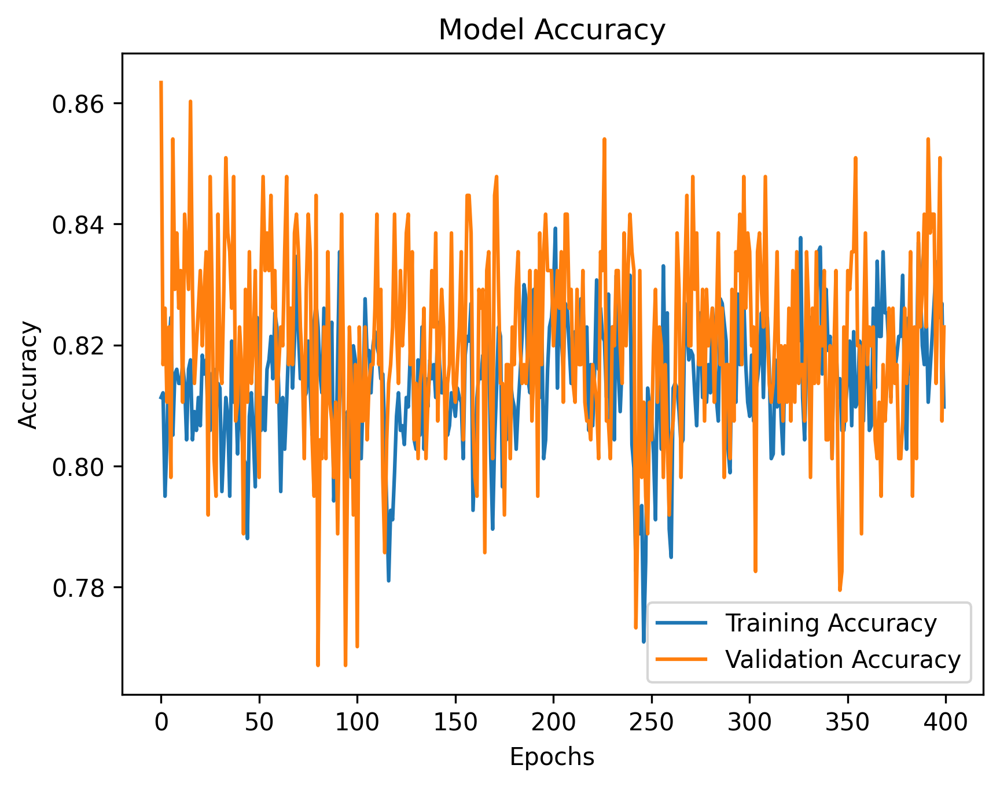

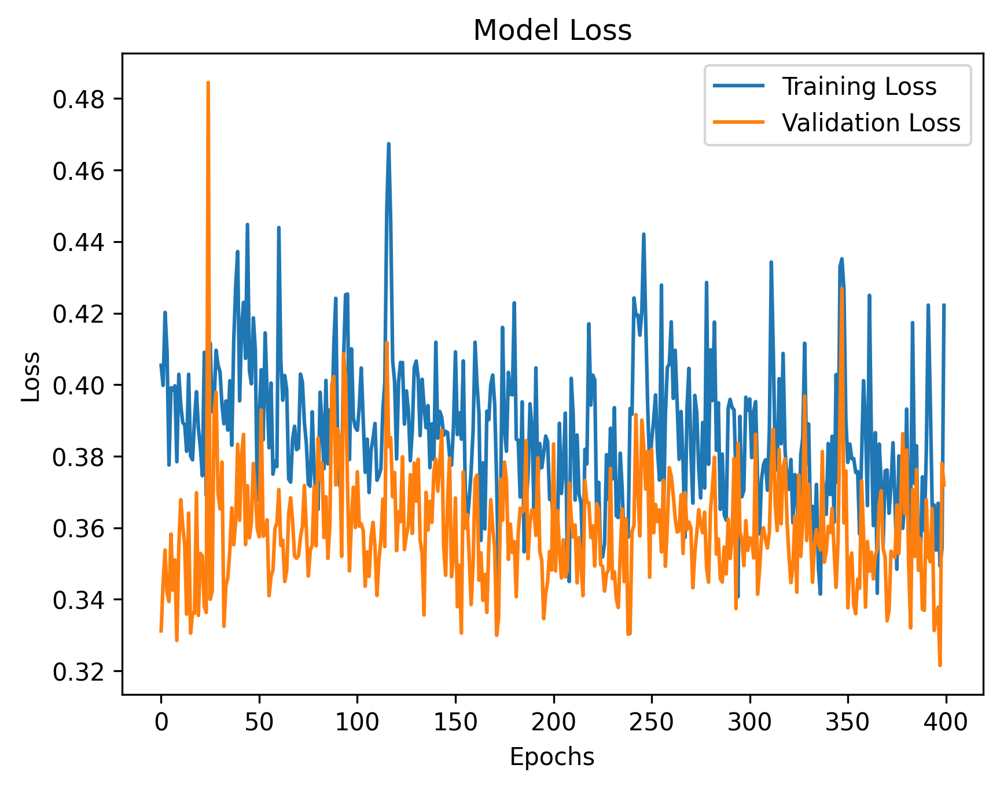

In [ ]:
# Example of model training and history recovery
history = best_model.fit(X_trainStandart, y_train, validation_split=0.20, epochs=400, verbose=1)

# Plot of accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.rcParams['figure.dpi'] = 300
plt.show()

# Plot of loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.rcParams['figure.dpi'] = 300
plt.show()

In [ ]:
# Calculate accuracy for each set
dl_acc_tr = best_model.evaluate(X_trainStandart, y_train)[1]
print("Deep Learning Training Accuracy:", dl_acc_tr)
dl_acc = best_model.evaluate(X_testStandart, y_test)[1]
print("Deep Learning Model Accuracy:", dl_acc)

51/51 [==============================] - 0s 2ms/step - loss: 0.3081 - accuracy: 0.8441
Deep Learning Training Accuracy: 0.8440994024276733
13/13 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.8089
Deep Learning Model Accuracy: 0.8089330196380615


In [ ]:
# Predictions as score
"""
Si effettuano previsioni utilizzando il modello migliore sui dati standardizzati.
Come output otteniamo i logits delle previsioni, un range di valori non probabilistici;
successivamente elaboriamo attraverso la Softmax i risultati convertendo i valori
in una distribuzione di probabilità.

"""

dl_pred_logits = best_model.predict(X_testStandart)
print(f"two example output vectors:\n {dl_pred_logits[:2]}")
print("largest value", np.max(dl_pred_logits), "smallest value", np.min(dl_pred_logits))

13/13 [==============================] - 0s 2ms/step
two example output vectors:
 [[ 1.390583   1.2529444 -7.0936437]
 [-8.827549  -0.5110513  2.440672 ]]
largest value 123.407524 smallest value -189.08372


In [ ]:
# Predictions as probability
dl_pred_prob = tf.nn.softmax(dl_pred_logits).numpy()
print(f"two example output vectors:\n {dl_pred_prob[:2]}")
print("largest value", np.max(dl_pred_prob), "smallest value", np.min(dl_pred_prob))

two example output vectors:
 [[5.3429639e-01 4.6559307e-01 1.1044082e-04]
 [1.2138074e-05 4.9654532e-02 9.5033330e-01]]
largest value 1.0 smallest value 0.0


In [ ]:
# The most likely class for each output vector
dl_pred = np.argmax(dl_pred_prob, axis=1)

In [ ]:
# Classification Report & Confusion Matrix
print("Deep Learning Classification Report\n\n", classification_report(y_test, dl_pred))

Deep Learning Classification Report

               precision    recall  f1-score   support

           0       0.88      0.77      0.82       159
           1       0.64      0.82      0.72       114
           2       0.94      0.85      0.89       130

    accuracy                           0.81       403
   macro avg       0.82      0.81      0.81       403
weighted avg       0.83      0.81      0.81       403



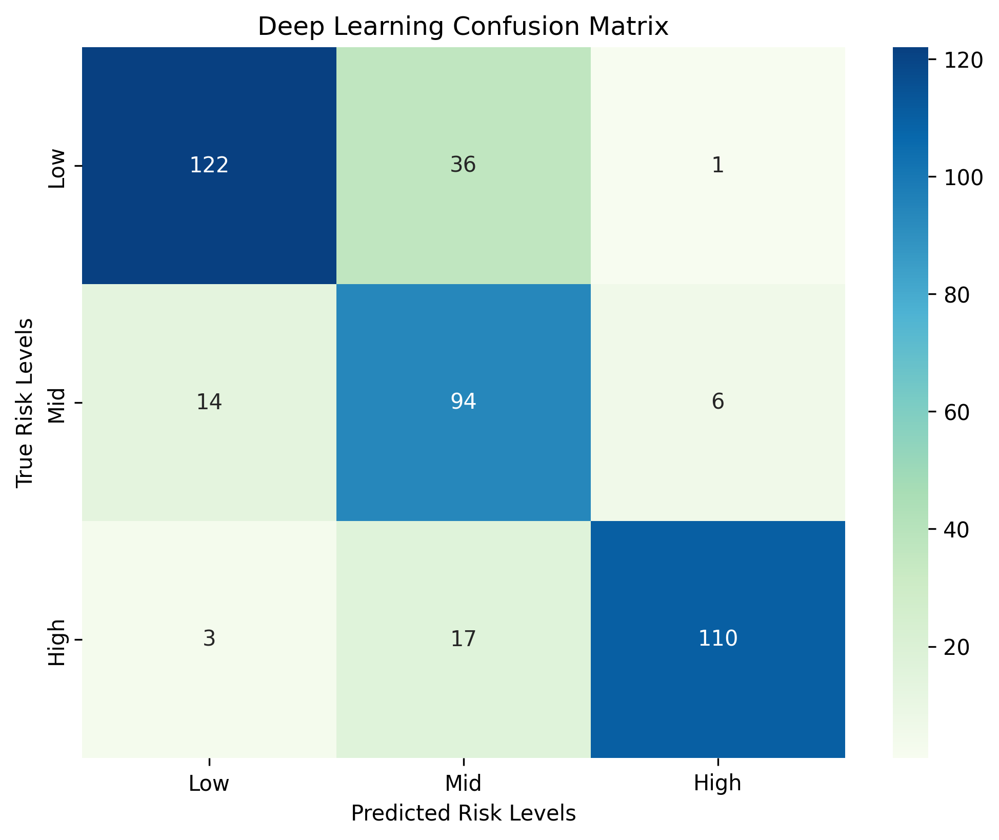

In [ ]:
dl_cm = confusion_matrix(y_test, dl_pred, labels=np.arange(0, 3))

# Plot
plt.figure(figsize=(8, 6))
ax = sns.heatmap(dl_cm, annot=True, cmap="GnBu", fmt='d')
ax.set_xlabel("Predicted Risk Levels")
ax.set_ylabel("True Risk Levels")
ax.set_title("Deep Learning Confusion Matrix")
ax.xaxis.set_ticklabels(["Low", "Mid", "High"])
ax.yaxis.set_ticklabels(["Low", "Mid", "High"])
plt.show()

##Deep Learning Tensorflow 3l

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)
# Standardization Z-score
scaler = preprocessing.StandardScaler()
X_trainStandart = scaler.fit_transform(X_train)
X_testStandart = scaler.transform(X_test)

# Create Model for GridSearchCV with Dense layers
def create_model(neurons_1, neurons_2, epochs=400, activation='relu'):
    model = keras.models.Sequential()
    model.add(keras.layers.Dense(units=neurons_1, input_shape=(X_trainStandart.shape[1],), activation=activation))
    model.add(keras.layers.Dropout(rate=0.2))
    model.add(keras.layers.Dense(units=neurons_2, activation=activation))
    model.add(keras.layers.Dropout(rate=0.2))
    model.add(keras.layers.Dense(units=3, activation='linear'))
    model.compile(optimizer=tf.keras.optimizers.Adam(0.01), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
    early_stopping = EarlyStopping(monitor='loss', patience=3, verbose=1, restore_best_weights=True, mode='min')
    return model

params= dict(neurons_1=[45, 65, 75],
             neurons_2=[15, 25, 35])
# Creation of KerasClassifier wrapper for Scikit-learn
model = KerasClassifier(build_fn=create_model, neurons_1=[45, 65, 75], neurons_2=[15, 25, 35], epochs=400)
gs = GridSearchCV(estimator=model, param_grid=params, scoring='accuracy', cv=3)
gs_results = gs.fit(X_trainStandart, y_train)
print(gs_results.best_score_, gs_results.best_params_)

Output streaming troncato alle ultime 5000 righe.
17/17 [==============================] - 0s 5ms/step - loss: 0.4032 - accuracy: 0.8000
Epoch 305/400
17/17 [==============================] - 0s 5ms/step - loss: 0.3875 - accuracy: 0.7981
Epoch 306/400
17/17 [==============================] - 0s 5ms/step - loss: 0.3899 - accuracy: 0.8074
Epoch 307/400
17/17 [==============================] - 0s 5ms/step - loss: 0.3842 - accuracy: 0.8167
Epoch 308/400
17/17 [==============================] - 0s 5ms/step - loss: 0.3901 - accuracy: 0.8019
Epoch 309/400
17/17 [==============================] - 0s 4ms/step - loss: 0.3937 - accuracy: 0.8019
Epoch 310/400
17/17 [==============================] - 0s 4ms/step - loss: 0.3940 - accuracy: 0.8037
Epoch 311/400
17/17 [==============================] - 0s 4ms/step - loss: 0.3970 - accuracy: 0.8167
Epoch 312/400
17/17 [==============================] - 0s 5ms/step - loss: 0.3674 - accuracy: 0.8130
Epoch 313/400
17/17 [==============================] - 

In [ ]:
# Model creation
best_model = gs_results.best_estimator_.model_
best_model.summary()

Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_81 (Dense)            (None, 65)                455       
                                                                 
 dropout_54 (Dropout)        (None, 65)                0         
                                                                 
 dense_82 (Dense)            (None, 25)                1650      
                                                                 
 dropout_55 (Dropout)        (None, 25)                0         
                                                                 
 dense_83 (Dense)            (None, 3)                 78        
                                                                 
Total params: 2183 (8.53 KB)
Trainable params: 2183 (8.53 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch 1/400
21/21 [==============================] - 1s 26ms/step - loss: 0.4179 - accuracy: 0.7731 - val_loss: 0.3437 - val_accuracy: 0.8272
Epoch 2/400
21/21 [==============================] - 0s 8ms/step - loss: 0.4228 - accuracy: 0.7978 - val_loss: 0.3464 - val_accuracy: 0.8333
Epoch 3/400
21/21 [==============================] - 0s 6ms/step - loss: 0.4119 - accuracy: 0.8025 - val_loss: 0.3496 - val_accuracy: 0.8457
Epoch 4/400
21/21 [==============================] - 0s 7ms/step - loss: 0.4164 - accuracy: 0.7978 - val_loss: 0.3586 - val_accuracy: 0.8086
Epoch 5/400
21/21 [==============================] - 0s 10ms/step - loss: 0.4174 - accuracy: 0.7994 - val_loss: 0.3622 - val_accuracy: 0.8148
Epoch 6/400
21/21 [==============================] - 0s 10ms/step - loss: 0.4204 - accuracy: 0.7685 - val_loss: 0.3657 - val_accuracy: 0.8148
Epoch 7/400
21/21 [==============================] - 0s 10ms/step - loss: 0.4135 - accuracy: 0.7994 - val_loss: 0.3567 - val_accuracy: 0.7963
Epoch 8/4

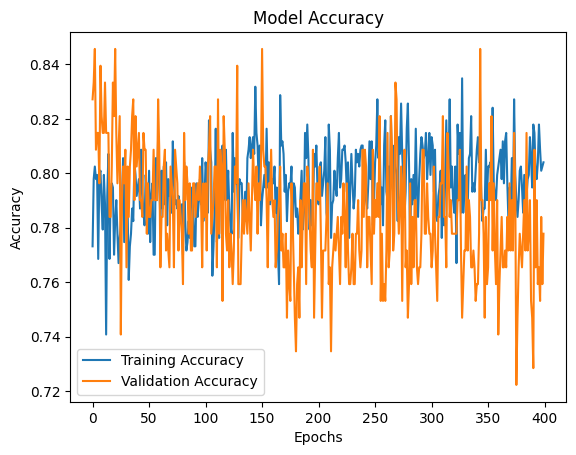

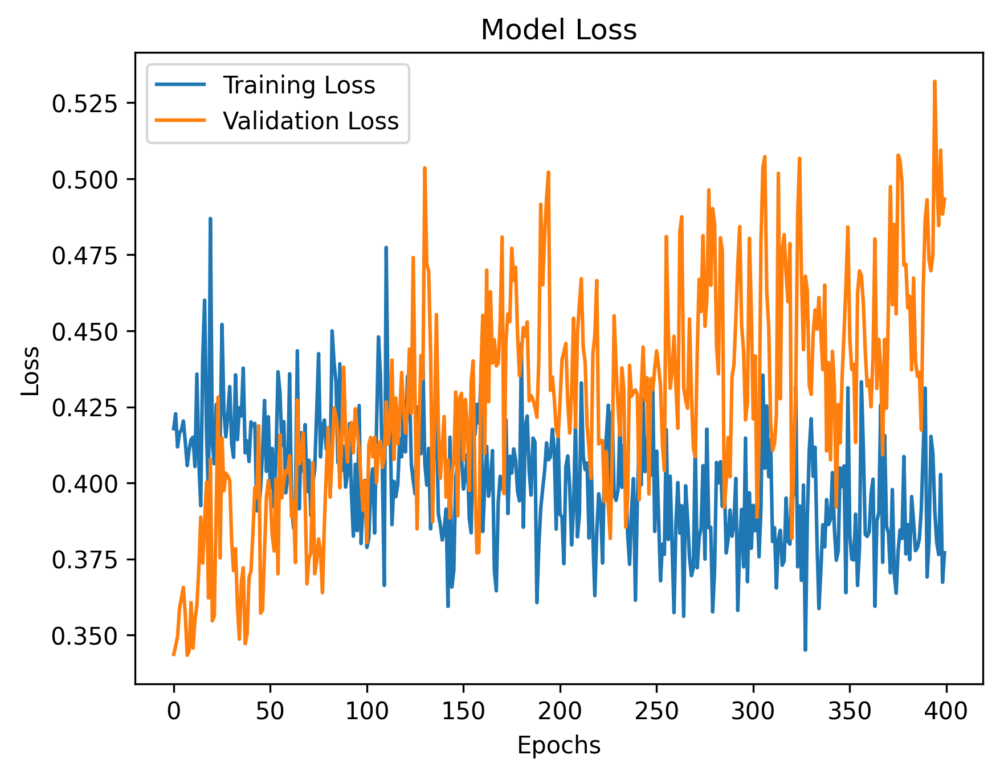

In [ ]:
# Example of model training and history recovery
history = best_model.fit(X_trainStandart, y_train, validation_split=0.20, epochs=400, verbose=1)

# Plot of accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.rcParams['figure.dpi'] = 300
plt.show()

# Plot of loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.rcParams['figure.dpi'] = 300
plt.show()

In [ ]:
# Calculate accuracy for each set
dl_acc_tr = best_model.evaluate(X_trainStandart, y_train)[1]
print("Deep Learning Training Accuracy:", dl_acc_tr)
dl_acc = best_model.evaluate(X_testStandart, y_test)[1]
print("Deep Learning Model Accuracy:", dl_acc)

26/26 [==============================] - 0s 3ms/step - loss: 0.3458 - accuracy: 0.8296
Deep Learning Training Accuracy: 0.8296296000480652
7/7 [==============================] - 0s 4ms/step - loss: 0.7899 - accuracy: 0.7783
Deep Learning Model Accuracy: 0.7783251404762268


In [ ]:
# Predictions as score
dl_pred_logits = best_model.predict(X_testStandart)
print(f"two example output vectors:\n {dl_pred_logits[:2]}")
print("largest value", np.max(dl_pred_logits), "smallest value", np.min(dl_pred_logits))

7/7 [==============================] - 0s 3ms/step
two example output vectors:
 [[  3.11436     -0.66955334 -18.778576  ]
 [-34.942017    17.654669   -25.101572  ]]
largest value 180.79562 smallest value -499.09375


In [ ]:
# Predictions as probability
dl_pred_prob = tf.nn.softmax(dl_pred_logits).numpy()
print(f"two example output vectors:\n {dl_pred_prob[:2]}")
print("largest value", np.max(dl_pred_prob), "smallest value", np.min(dl_pred_prob))

two example output vectors:
 [[9.7777176e-01 2.2228226e-02 3.0356795e-10]
 [1.4373049e-23 9.9999994e-01 2.6989851e-19]]
largest value 0.99999994 smallest value 0.0


In [ ]:
# The most likely class for each output vector
dl_pred = np.argmax(dl_pred_prob, axis=1)

In [ ]:
# Classification Report & Confusion Matrix
print("Deep Learning Classification Report\n\n", classification_report(y_test, dl_pred))

Deep Learning Classification Report

               precision    recall  f1-score   support

           0       0.76      0.76      0.76        78
           1       0.69      0.73      0.71        63
           2       0.91      0.85      0.88        62

    accuracy                           0.78       203
   macro avg       0.79      0.78      0.78       203
weighted avg       0.78      0.78      0.78       203



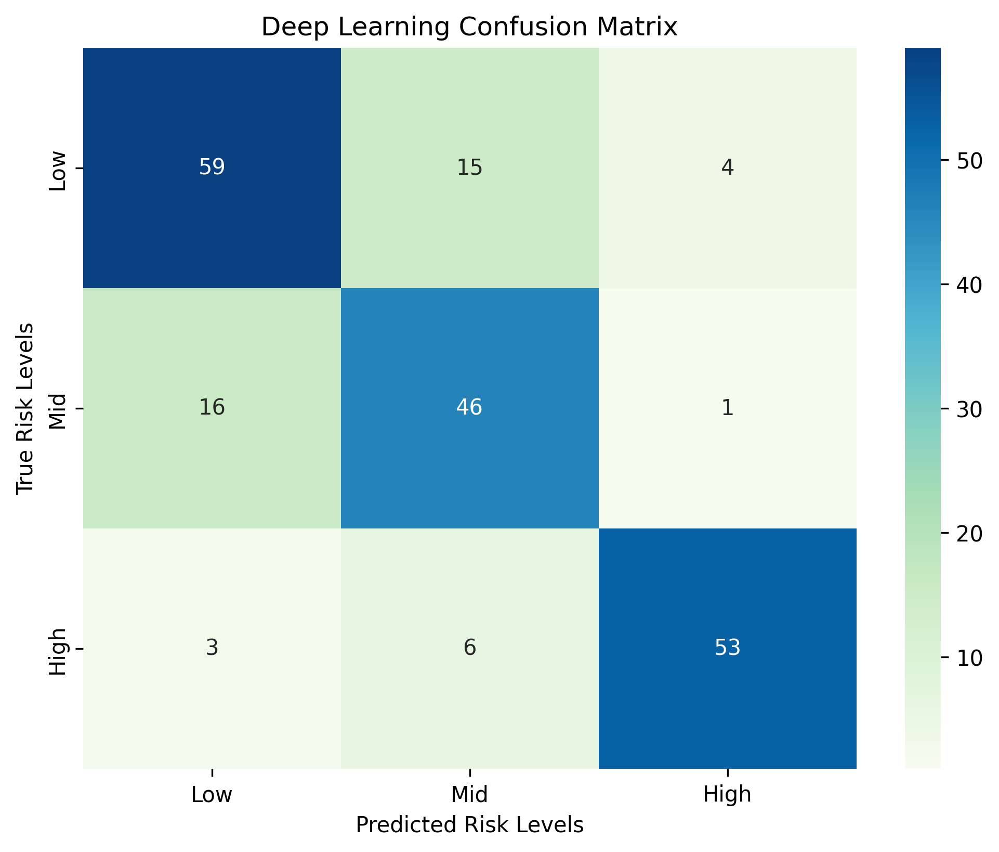

In [ ]:
dl_cm = confusion_matrix(y_test, dl_pred, labels=np.arange(0, 3))

# Plot
plt.figure(figsize=(8, 6))
ax = sns.heatmap(dl_cm, annot=True, cmap="GnBu", fmt='d')
ax.set_xlabel("Predicted Risk Levels")
ax.set_ylabel("True Risk Levels")
ax.set_title("Deep Learning Confusion Matrix")
ax.xaxis.set_ticklabels(["Low", "Mid", "High"])
ax.yaxis.set_ticklabels(["Low", "Mid", "High"])
plt.show()

#Models comparison

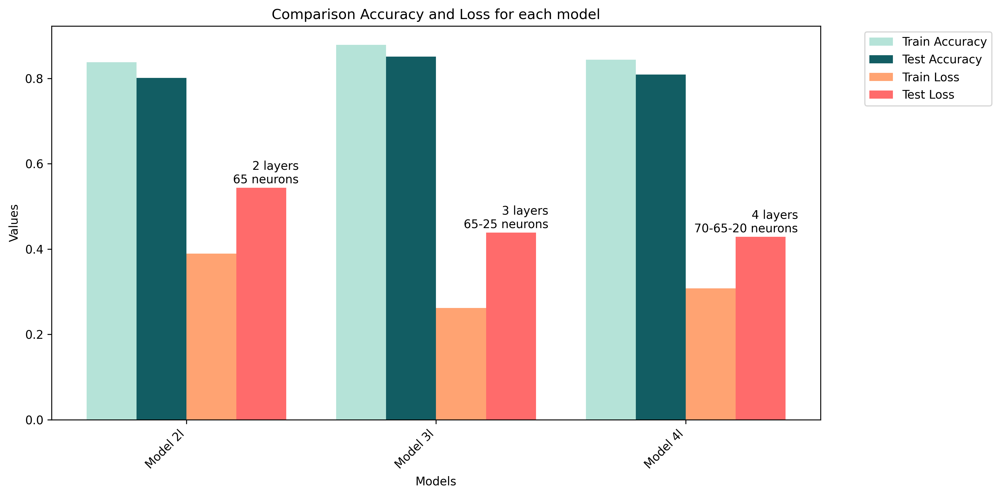

In [ ]:
# Comparison Neural Networks
model_names = ['Model 2l', 'Model 3l', 'Model 4l']
train_accuracies = [0.8379,0.8789,0.8441]
test_accuracies = [0.8015,0.8511,0.8089]
train_losses = [0.3897,0.2618,0.3081]
test_losses = [0.5439,0.4389,0.4290]
num_layers = [2,3,4]
num_neurons = [65,"65-25","70-65-20"]

plt.figure(figsize=(12, 6))
plt.bar(np.arange(len(model_names)) - 0.3, train_accuracies, 0.2, label="Train Accuracy", color="#b5e3d8")
plt.bar(np.arange(len(model_names)) - 0.1, test_accuracies, 0.2, label="Test Accuracy", color="#125d63")
plt.bar(np.arange(len(model_names)) + 0.1, train_losses, 0.2, label="Train Loss", color="#ffa372")
plt.bar(np.arange(len(model_names)) + 0.3, test_losses, 0.2, label="Test Loss", color="#ff6b6b")
plt.xticks(np.arange(len(model_names)), model_names, rotation=45, ha="right")
plt.xlabel("Models")
plt.ylabel("Values")
plt.title("Comparison Accuracy and Loss for each model")
for i in range(len(model_names)):
    plt.text(i + 0.45, max(train_losses[i], test_losses[i]) + 0.01, f"{num_layers[i]} layers\n{num_neurons[i]} neurons", ha='right', va='baseline')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [ ]:
# Creating comparison lists
metrics = ["Accuracy"]
model_names = ["LogisticRegression", "DeepLearning"]
acc_list = [test_acc_LR, dl_acc]
tr_acc_list = [train_acc_LR, dl_acc_tr]

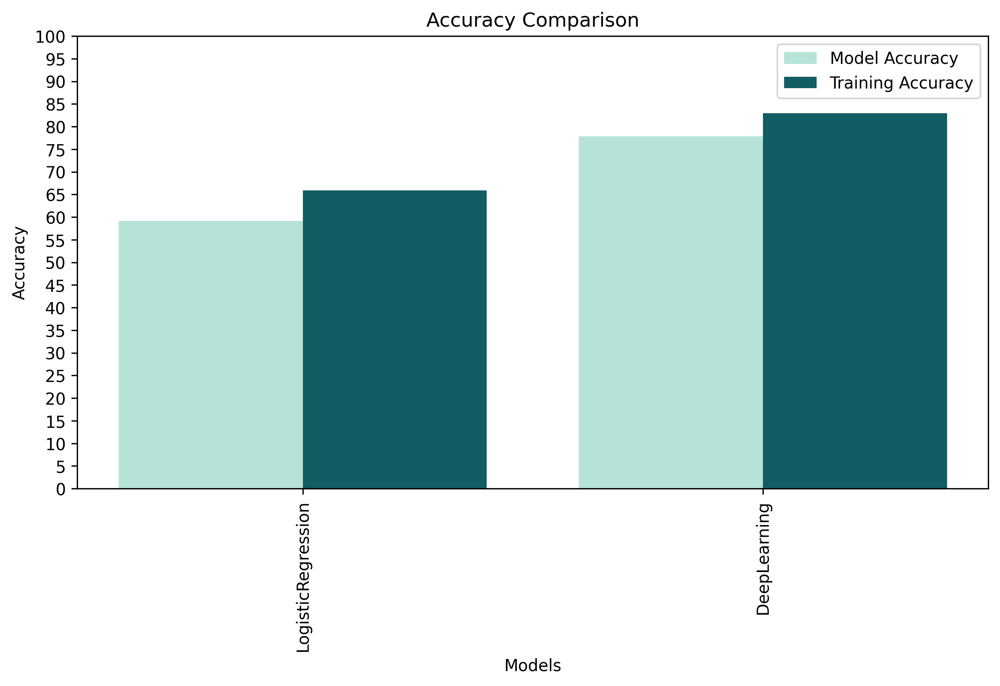

In [ ]:
plt.figure(figsize = (10, 5))

plt.bar(np.arange(len(model_names)) - 0.2,
        np.array(acc_list)*100, 0.4, label = "Model Accuracy", color = "#b5e3d8")
plt.bar(np.arange(len(model_names)) + 0.2,
        np.array(tr_acc_list)*100, 0.4, label = "Training Accuracy", color = "#125d63")
plt.xticks(np.arange(len(model_names)), model_names, rotation = 90)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Accuracy Comparison")
plt.yticks(np.arange(0, 105, 5))
plt.legend(bbox_to_anchor = (1, 1), loc = "best")
plt.show()

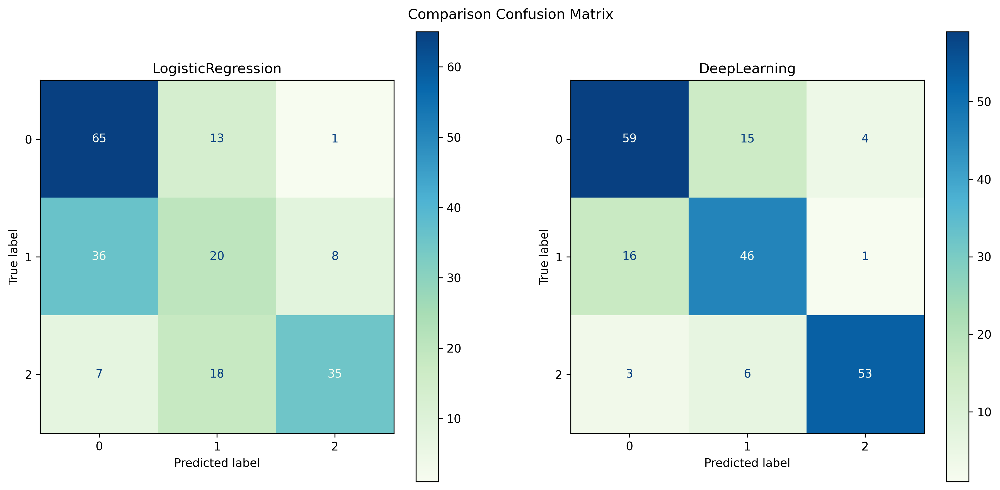

In [ ]:
# Display of confusion matrix for each model
disp1 = ConfusionMatrixDisplay(confusion_matrix=lr_cm, display_labels=np.arange(0, 3))
disp2 = ConfusionMatrixDisplay(confusion_matrix=dl_cm, display_labels=np.arange(0, 3))

# Subplot
fig, axes = plt.subplots(1, 2, figsize=(15, 7))

# Plot confusion matrix for each model
axes[0].set_title(model_names[0])
disp1.plot(include_values=True, cmap="GnBu", ax=axes[0])

axes[1].set_title(model_names[1])
disp2.plot(include_values=True, cmap="GnBu", ax=axes[1])

fig.suptitle("Comparison Confusion Matrix", y=0.92)

plt.show()


Come si può vedere dalle matrici di confusione, la Logistic Regression prevede un livello di rischio basso più correttamente, mentre il Deep Learning quelli di rischio medio e alto. Poiché si tratta di un set di dati medici, le previsioni più importanti per noi sono di alto livello di rischio.

# Generate and Balance the Data

In [ ]:
#Class Imbalance Ratio (CIR)
"""
Misuriamo il grado di squilibrio tra le classi della variabile target nel dataset.
Un CIR più grande indica un maggiore squilibrio tra le classi.

"""
class_counts = df["RiskLevel"].value_counts()
cir = class_counts.max() / class_counts.min()

print(f"Class Imbalance Ratio (CIR): {cir}")

Class Imbalance Ratio (CIR): 1.4889705882352942


Questo valore suggerisce che c'è un piccolo squilibrio tra le classi della variabile target nel dataset.

##Data generation

In [ ]:
"""
Alimentiamo il dataset originario generando nuovi examples attraverso la funzione
di Bootstrapping. I nuovi dati sono generati selezionando casualmente campioni
dal dataset esistente con sostituzione, mantenendo le caratteristiche generali del
dataset originale. La funzione seleziona casualmente "num_samples" righe dal dataset
Vengono mantenute nel dataset solo le righe con RiskLevel [0, 1, 2].

"""
def bootstrap_sampling_with_limit(dataframe, num_samples):
    sampled_data = dataframe.sample(n=num_samples, replace=True)
    sampled_data = sampled_data[sampled_data['RiskLevel'].isin([0, 1, 2])]
    return sampled_data

numero_di_campioni = 1000

nuovi_dati = bootstrap_sampling_with_limit(df, numero_di_campioni)

df_concatenato = pd.concat([df, nuovi_dati], ignore_index=True)

print(df_concatenato)

      Age  SystolicBP  DiastolicBP    BS  BodyTemp  HeartRate  RiskLevel
0      25         130           80  15.0      98.0         86          2
1      35         140           90  13.0      98.0         70          2
2      29          90           70   8.0     100.0         80          2
3      30         140           85   7.0      98.0         70          2
4      35         120           60   6.1      98.0         76          0
...   ...         ...          ...   ...       ...        ...        ...
2008   15         120           80   6.8      98.0         70          0
2009   32         120           90   7.5      98.0         70          0
2010   32         140          100   7.9      98.0         78          2
2011   55         100           65   7.5      98.0         66          0
2012   33         120           75  10.0      98.0         70          2

[2013 rows x 7 columns]


## Data balancing

In [ ]:
"""
Per il bilanciamento delle classi è stata utilizzata "SMOTE" (Synthetic Minority Over-sampling Technique),
una tecnica di sovracampionamento. Questa crea nuovi campioni sintetici della classe minoritaria basati
su relazioni lineari tra le istanze esistenti della classe stessa, calcolando
le differenze tra i vicini dei campioni e utilizzandole per crearne di nuovi sintetici.

"""
X = df_concatenato.drop('RiskLevel', axis=1)
y = df_concatenato['RiskLevel']

smote = SMOTE(random_state=20)
X_resampled, y_resampled = smote.fit_resample(X, y)

print(X_resampled)
print(y_resampled)

      Age  SystolicBP  DiastolicBP         BS    BodyTemp  HeartRate
0      25         130           80  15.000000   98.000000         86
1      35         140           90  13.000000   98.000000         70
2      29          90           70   8.000000  100.000000         80
3      30         140           85   7.000000   98.000000         70
4      35         120           60   6.100000   98.000000         76
...   ...         ...          ...        ...         ...        ...
2392   55         140           95  19.000000   98.000000         77
2393   29         120           75   7.202014   99.998561         70
2394   60         120           85  15.000000   98.000000         60
2395   60         120           85  15.000000   98.000000         60
2396   12          90           60   7.922513  102.000000         63

[2397 rows x 6 columns]
0       2
1       2
2       2
3       2
4       0
       ..
2392    2
2393    2
2394    2
2395    2
2396    2
Name: RiskLevel, Length: 2397, dtype:

In [ ]:
risk_levels = y_resampled.value_counts()
print(risk_levels)

2    799
0    799
1    799
Name: RiskLevel, dtype: int64


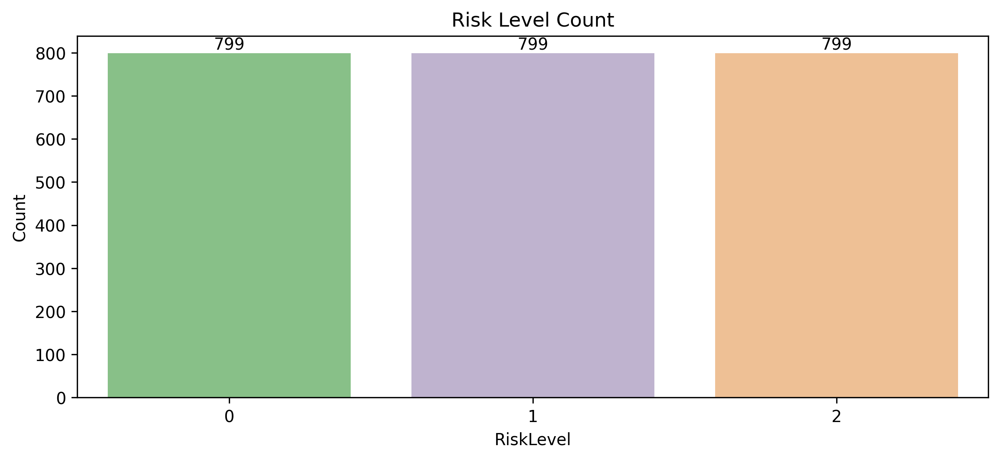

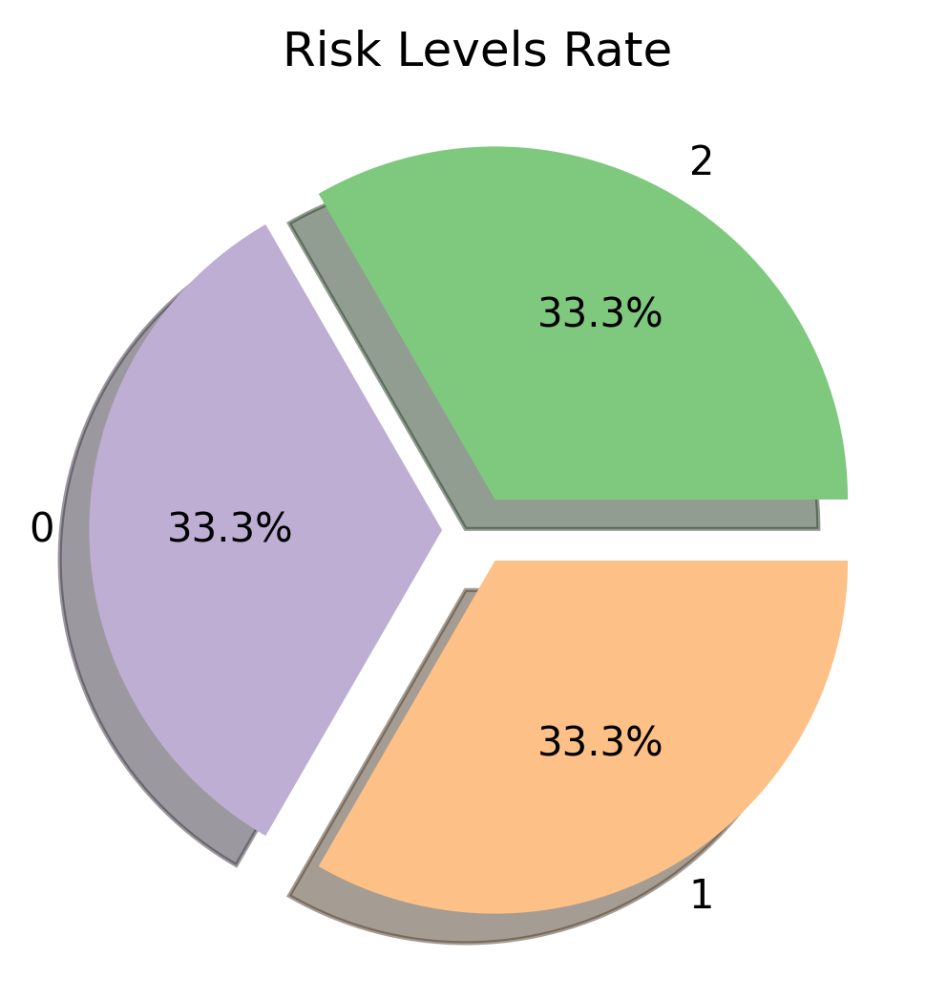

In [ ]:
risk_levels_df = pd.DataFrame({"RiskLevel": risk_levels.index, "Count": risk_levels.values})

# Plotting risk level counts
palette = "Accent"
plt.figure(figsize=(10, 4))
ax = sns.barplot(data=risk_levels_df, x="RiskLevel", y="Count", palette=palette)
for container in ax.containers:
    ax.bar_label(container)
plt.title("Risk Level Count")
plt.show()

# Plotting risk level rates
plt.figure(figsize=(10, 4))
plt.pie(x=risk_levels, explode=[0.1, 0.1, 0.1], labels=risk_levels.index,
        colors=plt.get_cmap(palette)(range(len(risk_levels))), autopct="%.1f%%", shadow=True)
plt.title("Risk Levels Rate")
plt.show()


#Modelling

##Logistic Regression Classifier

In [ ]:
X_train, x_, y_train, y_ = train_test_split(X_resampled, y_resampled, test_size=0.40, random_state=1)
X_cv, X_test, y_cv, y_test = train_test_split(x_, y_, test_size=0.50, random_state=1)

# Delete temporary variables
del x_, y_

print(f"the shape of the training set (input) is: {X_train.shape}")
print(f"the shape of the training set (target) is: {y_train.shape}\n")
print(f"the shape of the cross validation set (input) is: {X_cv.shape}")
print(f"the shape of the cross validation set (target) is: {y_cv.shape}\n")
print(f"the shape of the test set (input) is: {X_test.shape}")
print(f"the shape of the test set (target) is: {y_test.shape}")

the shape of the training set (input) is: (1438, 6)
the shape of the training set (target) is: (1438,)

the shape of the cross validation set (input) is: (479, 6)
the shape of the cross validation set (target) is: (479,)

the shape of the test set (input) is: (480, 6)
the shape of the test set (target) is: (480,)


In [ ]:
# Standardization Z-score
scaler = preprocessing.StandardScaler()
X_trainStandart = scaler.fit_transform(X_train)
X_cvStandart = scaler.transform(X_cv)
X_testStandart = scaler.transform(X_test)

In [ ]:
# Baseline LR with Scikit
logistic_regression = linear_model.LogisticRegression()
logistic_regression.fit(X_trainStandart, y_train)
pred_logistic_regression = logistic_regression.predict(X_testStandart)
print("Prediction on training set:", pred_logistic_regression)
print(f"Accuracy on test set: {round(logistic_regression.score(X_testStandart, y_test), 3)}")

Prediction on training set: [1 0 1 1 0 1 0 0 2 1 2 0 2 2 2 2 0 2 1 1 0 0 0 0 2 2 1 2 2 2 0 1 2 2 1 1 1
 0 0 0 1 2 1 0 1 0 2 2 1 2 1 2 0 2 2 2 0 1 2 1 0 0 1 1 1 1 1 2 0 2 0 1 0 1
 2 1 0 0 1 2 2 1 0 2 0 0 2 1 1 0 1 1 0 0 1 1 1 0 0 1 1 1 1 0 1 0 0 2 2 1 0
 0 0 0 1 2 0 0 0 1 2 1 0 2 1 1 2 2 0 1 1 0 0 0 2 0 0 0 1 2 2 1 2 0 1 1 1 1
 2 2 2 2 0 0 0 2 1 0 0 0 2 1 2 0 1 0 1 2 1 1 1 1 1 2 1 0 1 1 1 0 2 0 0 2 2
 2 2 1 1 1 1 1 0 2 2 1 0 2 0 2 1 1 2 2 0 2 1 1 0 2 0 1 0 2 1 0 0 2 2 0 2 2
 2 1 2 1 2 2 2 1 0 1 2 2 1 1 0 2 0 2 2 0 0 2 0 0 2 0 1 2 2 2 2 2 0 0 2 1 1
 0 0 0 0 1 2 1 2 2 2 0 0 1 0 1 0 2 1 2 0 1 0 2 0 2 2 2 2 0 0 1 2 1 1 0 0 1
 2 2 1 2 1 0 1 1 1 0 1 0 2 1 1 1 2 2 2 1 0 1 1 2 1 0 1 1 1 0 1 1 0 1 0 0 0
 2 1 0 2 0 2 1 0 0 2 0 0 2 0 0 0 2 2 1 0 0 0 1 0 1 0 0 2 1 2 0 0 2 1 0 1 0
 2 0 2 2 2 0 2 2 1 2 2 1 0 1 0 2 0 0 1 1 0 2 2 0 2 2 1 0 1 2 2 1 2 0 2 0 1
 1 1 1 1 2 1 0 2 1 1 0 0 2 2 1 2 1 2 2 1 2 1 2 0 1 1 2 0 2 0 1 1 1 1 0 2 0
 1 2 2 0 0 1 1 0 1 1 1 1 2 0 0 2 0 0 2 2 0 0 0 1 0 0 0 0 1 1 0 2 0 2 1 0

In [ ]:
params_LR = {"tol": [0.0001,0.0002,0.0003],
            "C": [0.01, 0.1, 1, 10, 100],
            "penalty": ['l1', 'l2'],
            "intercept_scaling": [1, 2, 3, 4],
            "solver": ["liblinear", "lbfgs", "newton-cg"],
            "max_iter": [100, 200, 300],
              }

In [ ]:
# GridSearchCV initialization
GridSearchCV_LR = GridSearchCV(estimator=linear_model.LogisticRegression(),
                                param_grid=params_LR,
                                cv=3,
                                scoring = "accuracy")
# Fit model with train data
GridSearchCV_LR.fit(X_trainStandart, y_train);

# Best model
best_model_LR = GridSearchCV_LR.best_estimator_

In [ ]:
print(f"Best estimator for LR model:\n{GridSearchCV_LR.best_estimator_}")
print(f"Best parameter values for LR model:\n{GridSearchCV_LR.best_params_}")
print(f"Best score for LR model: {round(GridSearchCV_LR.best_score_, 3)}")

Best estimator for LR model:
LogisticRegression(C=0.01, intercept_scaling=3, solver='liblinear')
Best parameter values for LR model:
{'C': 0.01, 'intercept_scaling': 3, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear', 'tol': 0.0001}
Best score for LR model: 0.648


In [ ]:
# Predictions
train_pred_LR = best_model_LR.predict(X_trainStandart)
cv_pred_LR = best_model_LR.predict(X_cvStandart)
test_pred_LR = best_model_LR.predict(X_testStandart)

# Calculate accuracy for each set
train_acc_LR = accuracy_score(y_train, train_pred_LR)
cv_acc_LR = accuracy_score(y_cv, cv_pred_LR)
test_acc_LR = accuracy_score(y_test, test_pred_LR)

# Print the results
print(f"Best Model: {best_model_LR}")
print(f"Training Set Accuracy: {train_acc_LR:.4f}")
print(f"CV Set Accuracy: {cv_acc_LR:.4f}")
print(f"Test Set Accuracy: {test_acc_LR:.4f}")

Best Model: LogisticRegression(C=0.01, intercept_scaling=3, solver='liblinear')
Training Set Accuracy: 0.6502
CV Set Accuracy: 0.6347
Test Set Accuracy: 0.6417


In [ ]:
# Print Classification Report & Confusion Matrix
print("Classification Report")
print(classification_report(y_test, test_pred_LR))
print("Confusion Matrix:")
print(confusion_matrix(y_test, test_pred_LR))

Classification Report
              precision    recall  f1-score   support

           0       0.61      0.84      0.71       152
           1       0.47      0.39      0.43       153
           2       0.86      0.69      0.76       175

    accuracy                           0.64       480
   macro avg       0.64      0.64      0.63       480
weighted avg       0.65      0.64      0.64       480

Confusion Matrix:
[[128  21   3]
 [ 76  60  17]
 [  7  48 120]]


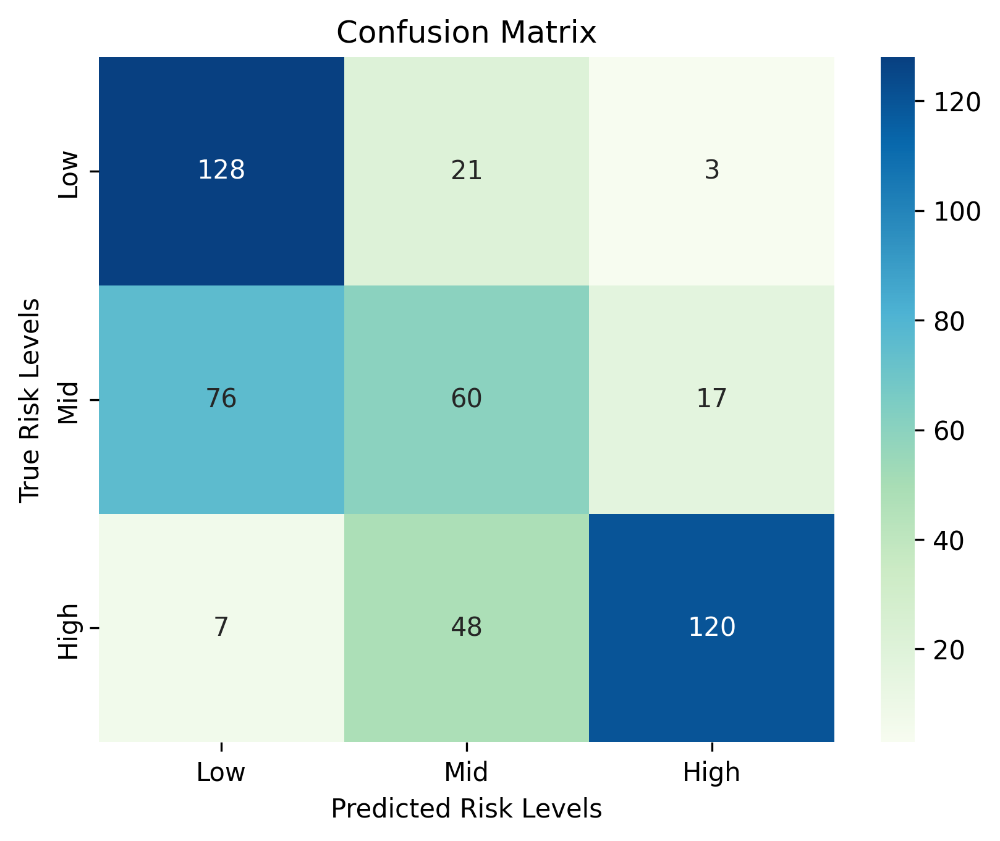

In [ ]:
ax= plt.subplot()
lr_cm = confusion_matrix(y_test, test_pred_LR)
sns.heatmap(lr_cm, annot=True, ax=ax, cmap="GnBu", fmt='d')
ax.set_xlabel("Predicted Risk Levels");
ax.set_ylabel("True Risk Levels");
ax.set_title("Confusion Matrix");
ax.xaxis.set_ticklabels(["Low", "Mid", "High"]);
ax.yaxis.set_ticklabels(["Low", "Mid", "High"]);

##Deep Learning Tensorflow 3l

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.20, random_state=1)
# Standardization Z-score
scaler = preprocessing.StandardScaler()
X_trainStandart = scaler.fit_transform(X_train)
X_testStandart = scaler.transform(X_test)

# Create Model for GridSearchCV with Dense layers
def create_model(neurons_1, neurons_2, epochs=400, activation='relu'):
    model = keras.models.Sequential()
    model.add(keras.layers.Dense(units=neurons_1, input_shape=(X_trainStandart.shape[1],), activation=activation))
    model.add(keras.layers.Dropout(rate=0.2))
    model.add(keras.layers.Dense(units=neurons_2, activation=activation))
    model.add(keras.layers.Dropout(rate=0.2))
    model.add(keras.layers.Dense(units=3, activation='linear'))
    model.compile(optimizer=tf.keras.optimizers.Adam(0.01), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
    early_stopping = EarlyStopping(monitor='loss', patience=3, verbose=1, restore_best_weights=True, mode='min')
    return model

params= dict(neurons_1=[75, 95, 110],
             neurons_2=[35, 55, 75])
# Creation of KerasClassifier wrapper for Scikit-learn
model = KerasClassifier(build_fn=create_model, neurons_1=[75, 95, 110], neurons_2=[35, 55, 75], epochs=400)
gs = GridSearchCV(estimator=model, param_grid=params, scoring='accuracy', cv=3)
gs_results = gs.fit(X_trainStandart, y_train)
print(gs_results.best_score_, gs_results.best_params_)

Output streaming troncato alle ultime 5000 righe.
40/40 [==============================] - 0s 4ms/step - loss: 0.3601 - accuracy: 0.8208
Epoch 305/400
40/40 [==============================] - 0s 6ms/step - loss: 0.3234 - accuracy: 0.8443
Epoch 306/400
40/40 [==============================] - 0s 5ms/step - loss: 0.3234 - accuracy: 0.8545
Epoch 307/400
40/40 [==============================] - 0s 4ms/step - loss: 0.3523 - accuracy: 0.8326
Epoch 308/400
40/40 [==============================] - 0s 4ms/step - loss: 0.3298 - accuracy: 0.8529
Epoch 309/400
40/40 [==============================] - 0s 4ms/step - loss: 0.3337 - accuracy: 0.8349
Epoch 310/400
40/40 [==============================] - 0s 5ms/step - loss: 0.3300 - accuracy: 0.8357
Epoch 311/400
40/40 [==============================] - 0s 4ms/step - loss: 0.3242 - accuracy: 0.8404
Epoch 312/400
40/40 [==============================] - 0s 5ms/step - loss: 0.3214 - accuracy: 0.8349
Epoch 313/400
40/40 [==============================] - 

In [ ]:
# Model creation
best_model = gs_results.best_estimator_.model_
best_model.summary()

Model: "sequential_193"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_661 (Dense)           (None, 110)               770       
                                                                 
 dropout_468 (Dropout)       (None, 110)               0         
                                                                 
 dense_662 (Dense)           (None, 75)                8325      
                                                                 
 dropout_469 (Dropout)       (None, 75)                0         
                                                                 
 dense_663 (Dense)           (None, 3)                 228       
                                                                 
Total params: 9323 (36.42 KB)
Trainable params: 9323 (36.42 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch 1/400
48/48 [==============================] - 1s 11ms/step - loss: 0.3318 - accuracy: 0.8487 - val_loss: 0.2596 - val_accuracy: 0.8646
Epoch 2/400
48/48 [==============================] - 0s 8ms/step - loss: 0.3259 - accuracy: 0.8415 - val_loss: 0.2537 - val_accuracy: 0.8646
Epoch 3/400
48/48 [==============================] - 0s 7ms/step - loss: 0.3153 - accuracy: 0.8487 - val_loss: 0.2603 - val_accuracy: 0.8646
Epoch 4/400
48/48 [==============================] - 0s 7ms/step - loss: 0.2984 - accuracy: 0.8532 - val_loss: 0.2791 - val_accuracy: 0.8464
Epoch 5/400
48/48 [==============================] - 0s 7ms/step - loss: 0.3388 - accuracy: 0.8513 - val_loss: 0.3133 - val_accuracy: 0.8385
Epoch 6/400
48/48 [==============================] - 0s 7ms/step - loss: 0.3193 - accuracy: 0.8545 - val_loss: 0.2892 - val_accuracy: 0.8620
Epoch 7/400
48/48 [==============================] - 0s 7ms/step - loss: 0.3248 - accuracy: 0.8506 - val_loss: 0.3056 - val_accuracy: 0.8333
Epoch 8/400


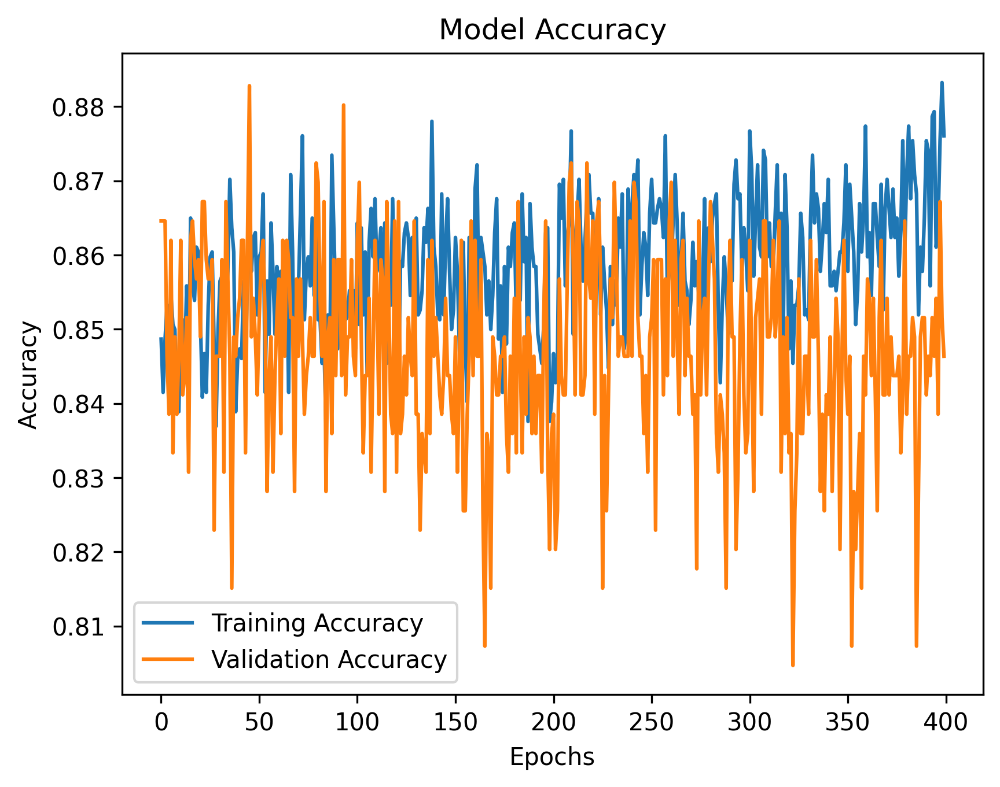

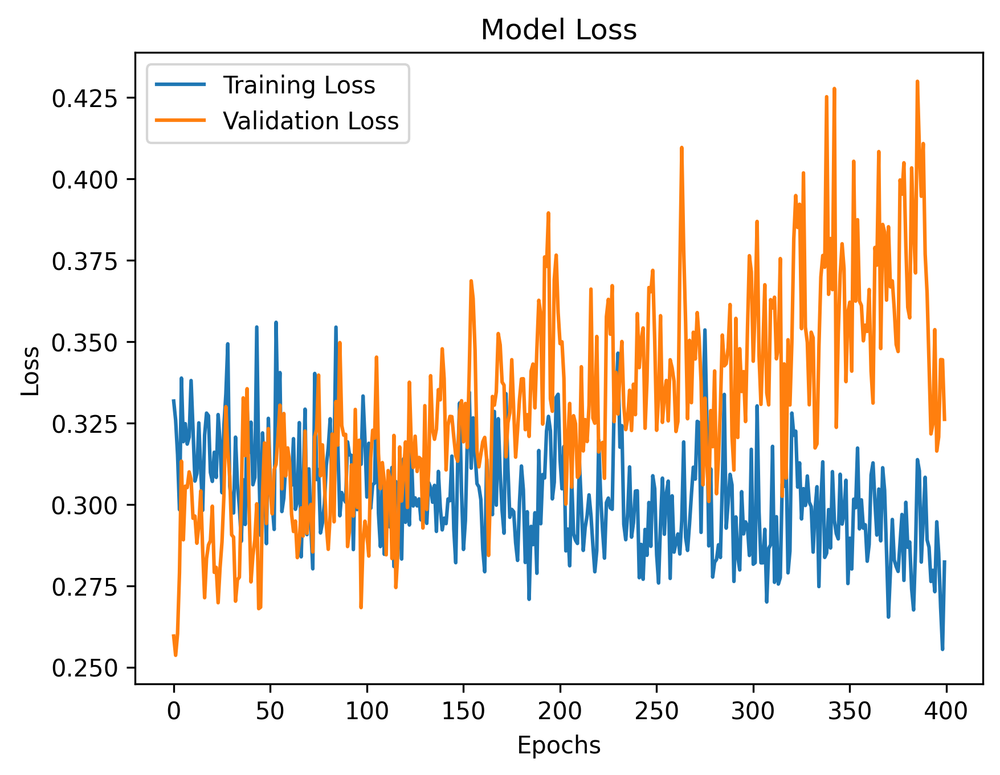

In [ ]:
# Example of model training and history recovery
history = best_model.fit(X_trainStandart, y_train, validation_split=0.20, epochs=400, verbose=1)

# Plot of accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.rcParams['figure.dpi'] = 300
plt.show()

# Plot of loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.rcParams['figure.dpi'] = 300
plt.show()

In [ ]:
# Calculate accuracy for each set
dl_acc_tr = best_model.evaluate(X_trainStandart, y_train)[1]
print("Deep Learning Training Accuracy:", dl_acc_tr)
dl_acc = best_model.evaluate(X_testStandart, y_test)[1]
print("Deep Learning Model Accuracy:", dl_acc)

60/60 [==============================] - 0s 4ms/step - loss: 0.2304 - accuracy: 0.8925
Deep Learning Training Accuracy: 0.892540454864502
15/15 [==============================] - 0s 3ms/step - loss: 0.3269 - accuracy: 0.9021
Deep Learning Model Accuracy: 0.9020833373069763


In [ ]:
# Predictions as score
dl_pred_logits = best_model.predict(X_testStandart)
print(f"two example output vectors:\n {dl_pred_logits[:2]}")
print("largest value", np.max(dl_pred_logits), "smallest value", np.min(dl_pred_logits))

15/15 [==============================] - 0s 3ms/step
two example output vectors:
 [[-10.937836    5.7580066 -16.352116 ]
 [-11.689598    2.2884557   2.0061772]]
largest value 815.57086 smallest value -706.4857


In [ ]:
# Predictions as probability
dl_pred_prob = tf.nn.softmax(dl_pred_logits).numpy()
print(f"two example output vectors:\n {dl_pred_prob[:2]}")
print("largest value", np.max(dl_pred_prob), "smallest value", np.min(dl_pred_prob))

two example output vectors:
 [[5.6116114e-08 9.9999994e-01 2.4985941e-10]
 [4.8457696e-07 5.7010454e-01 4.2989507e-01]]
largest value 0.99999994 smallest value 0.0


In [ ]:
# The most likely class for each output vector
dl_pred = np.argmax(dl_pred_prob, axis=1)

In [ ]:
# Classification Report & Confusion Matrix
print("Deep Learning Classification Report\n\n", classification_report(y_test, dl_pred))

Deep Learning Classification Report

               precision    recall  f1-score   support

           0       0.98      0.78      0.87       158
           1       0.81      0.94      0.87       152
           2       0.93      0.98      0.96       170

    accuracy                           0.90       480
   macro avg       0.91      0.90      0.90       480
weighted avg       0.91      0.90      0.90       480



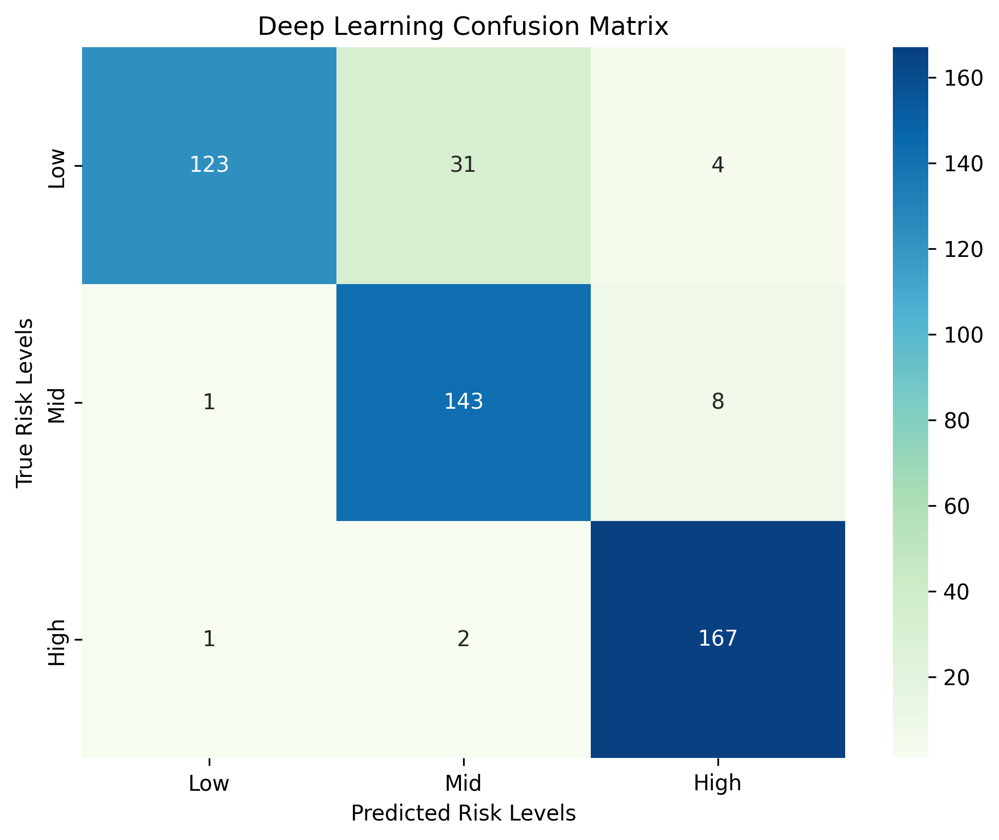

In [ ]:
dl_cm = confusion_matrix(y_test, dl_pred, labels=np.arange(0, 3))

# Plot
plt.figure(figsize=(8, 6))
ax = sns.heatmap(dl_cm, annot=True, cmap="GnBu", fmt='d')
ax.set_xlabel("Predicted Risk Levels")
ax.set_ylabel("True Risk Levels")
ax.set_title("Deep Learning Confusion Matrix")
ax.xaxis.set_ticklabels(["Low", "Mid", "High"])
ax.yaxis.set_ticklabels(["Low", "Mid", "High"])
plt.show()

##Deep Learning Tensorflow 4l

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)
# Standardization Z-score
scaler = preprocessing.StandardScaler()
X_trainStandart = scaler.fit_transform(X_train)
X_testStandart = scaler.transform(X_test)

# Create Model for GridSearchCV with Dense layers
def create_model(neurons_1,neurons_2, neurons_3, epochs=400, activation='relu'):
    model = keras.models.Sequential()
    model.add(keras.layers.Dense(units=neurons_1, input_shape=(X_trainStandart.shape[1],), activation=activation))
    model.add(keras.layers.Dropout(rate=0.2))
    model.add(keras.layers.Dense(units=neurons_2, activation=activation))
    model.add(keras.layers.Dropout(rate=0.2))
    model.add(keras.layers.Dense(units=neurons_3, activation=activation))
    model.add(keras.layers.Dropout(rate=0.2))
    model.add(keras.layers.Dense(units=3, activation='linear'))
    model.compile(optimizer=tf.keras.optimizers.Adam(0.01), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
    early_stopping = EarlyStopping(monitor='loss', patience=3, verbose=1, restore_best_weights=True, mode='min')
    return model

params= dict(neurons_1=[65, 75, 85],
             neurons_2=[35, 55, 75],
             neurons_3=[15, 25, 35])

# Creation of KerasClassifier wrapper for Scikit-learn
model = KerasClassifier(build_fn=create_model, neurons_1=[65, 75, 85], neurons_2=[35, 55, 75], neurons_3=[15, 25, 35], epochs=400)
gs = GridSearchCV(estimator=model, param_grid=params, scoring='accuracy', cv=3)
gs_results = gs.fit(X_trainStandart, y_train)
print(gs_results.best_score_, gs_results.best_params_)

Output streaming troncato alle ultime 5000 righe.
34/34 [==============================] - 0s 6ms/step - loss: 0.3950 - accuracy: 0.8043
Epoch 305/400
34/34 [==============================] - 0s 7ms/step - loss: 0.3833 - accuracy: 0.8062
Epoch 306/400
34/34 [==============================] - 0s 6ms/step - loss: 0.4065 - accuracy: 0.8080
Epoch 307/400
34/34 [==============================] - 0s 5ms/step - loss: 0.4292 - accuracy: 0.7884
Epoch 308/400
34/34 [==============================] - 0s 5ms/step - loss: 0.4143 - accuracy: 0.7987
Epoch 309/400
34/34 [==============================] - 0s 7ms/step - loss: 0.3944 - accuracy: 0.8145
Epoch 310/400
34/34 [==============================] - 0s 6ms/step - loss: 0.3815 - accuracy: 0.8155
Epoch 311/400
34/34 [==============================] - 0s 5ms/step - loss: 0.3638 - accuracy: 0.8350
Epoch 312/400
34/34 [==============================] - 0s 5ms/step - loss: 0.4037 - accuracy: 0.7959
Epoch 313/400
34/34 [==============================] - 

In [ ]:
# Model creation
best_model = gs_results.best_estimator_.model_
best_model.summary()

Model: "sequential_165"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_576 (Dense)           (None, 65)                455       
                                                                 
 dropout_411 (Dropout)       (None, 65)                0         
                                                                 
 dense_577 (Dense)           (None, 75)                4950      
                                                                 
 dropout_412 (Dropout)       (None, 75)                0         
                                                                 
 dense_578 (Dense)           (None, 15)                1140      
                                                                 
 dropout_413 (Dropout)       (None, 15)                0         
                                                                 
 dense_579 (Dense)           (None, 3)              

Epoch 1/400
41/41 [==============================] - 1s 11ms/step - loss: 0.4435 - accuracy: 0.7834 - val_loss: 0.3866 - val_accuracy: 0.8199
Epoch 2/400
41/41 [==============================] - 0s 6ms/step - loss: 0.4340 - accuracy: 0.7803 - val_loss: 0.4047 - val_accuracy: 0.7981
Epoch 3/400
41/41 [==============================] - 0s 5ms/step - loss: 0.4425 - accuracy: 0.7803 - val_loss: 0.4370 - val_accuracy: 0.7733
Epoch 4/400
41/41 [==============================] - 0s 6ms/step - loss: 0.4412 - accuracy: 0.7849 - val_loss: 0.4220 - val_accuracy: 0.7795
Epoch 5/400
41/41 [==============================] - 0s 4ms/step - loss: 0.4138 - accuracy: 0.7943 - val_loss: 0.4120 - val_accuracy: 0.7981
Epoch 6/400
41/41 [==============================] - 0s 7ms/step - loss: 0.4117 - accuracy: 0.7974 - val_loss: 0.3929 - val_accuracy: 0.8043
Epoch 7/400
41/41 [==============================] - 0s 7ms/step - loss: 0.3971 - accuracy: 0.7974 - val_loss: 0.4120 - val_accuracy: 0.7857
Epoch 8/400


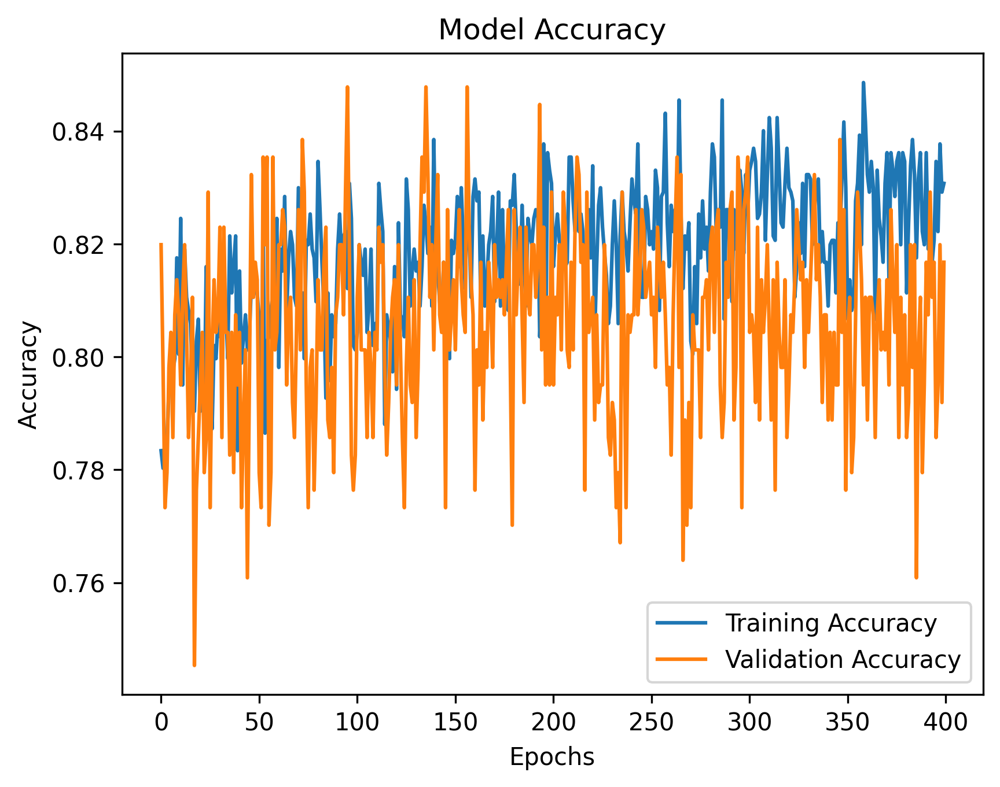

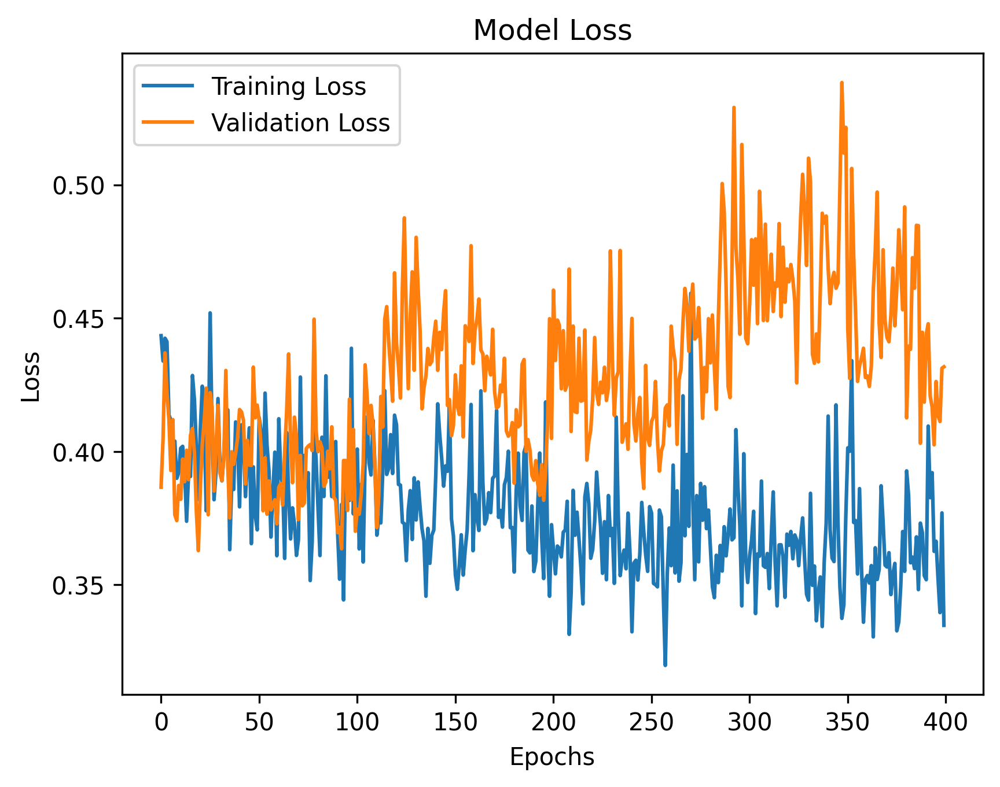

In [ ]:
# Example of model training and history recovery
history = best_model.fit(X_trainStandart, y_train, validation_split=0.20, epochs=400, verbose=1)

# Plot of accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.rcParams['figure.dpi'] = 300
plt.show()

# Plot of loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.rcParams['figure.dpi'] = 300
plt.show()

In [ ]:
# Calculate accuracy for each set
dl_acc_tr = best_model.evaluate(X_trainStandart, y_train)[1]
print("Deep Learning Training Accuracy:", dl_acc_tr)
dl_acc = best_model.evaluate(X_testStandart, y_test)[1]
print("Deep Learning Model Accuracy:", dl_acc)

51/51 [==============================] - 0s 3ms/step - loss: 0.2809 - accuracy: 0.8658
Deep Learning Training Accuracy: 0.8658385276794434
13/13 [==============================] - 0s 3ms/step - loss: 0.4052 - accuracy: 0.8313
Deep Learning Model Accuracy: 0.8312655091285706


In [ ]:
# Predictions as score
"""
Si effettuano previsioni utilizzando il modello migliore sui dati standardizzati.
Come output otteniamo i logits delle previsioni, un range di valori non probabilistici;
successivamente elaboriamo attraverso la Softmax i risultati convertendo i valori
in una distribuzione di probabilità.

"""

dl_pred_logits = best_model.predict(X_testStandart)
print(f"two example output vectors:\n {dl_pred_logits[:2]}")
print("largest value", np.max(dl_pred_logits), "smallest value", np.min(dl_pred_logits))

13/13 [==============================] - 0s 2ms/step
two example output vectors:
 [[  1.1687138   1.9551691  -8.255058 ]
 [-20.847929   -9.191549    2.8862162]]
largest value 250.05077 smallest value -214.7137


In [ ]:
# Predictions as probability
dl_pred_prob = tf.nn.softmax(dl_pred_logits).numpy()
print(f"two example output vectors:\n {dl_pred_prob[:2]}")
print("largest value", np.max(dl_pred_prob), "smallest value", np.min(dl_pred_prob))

two example output vectors:
 [[3.1292239e-01 6.8705231e-01 2.5278108e-05]
 [4.9248022e-11 5.6844783e-06 9.9999422e-01]]
largest value 0.99999994 smallest value 0.0


In [ ]:
# The most likely class for each output vector
dl_pred = np.argmax(dl_pred_prob, axis=1)

In [ ]:
# Classification Report & Confusion Matrix
print("Deep Learning Classification Report\n\n", classification_report(y_test, dl_pred))

Deep Learning Classification Report

               precision    recall  f1-score   support

           0       0.89      0.76      0.82       161
           1       0.70      0.90      0.78       125
           2       0.96      0.86      0.91       117

    accuracy                           0.83       403
   macro avg       0.85      0.84      0.84       403
weighted avg       0.85      0.83      0.83       403



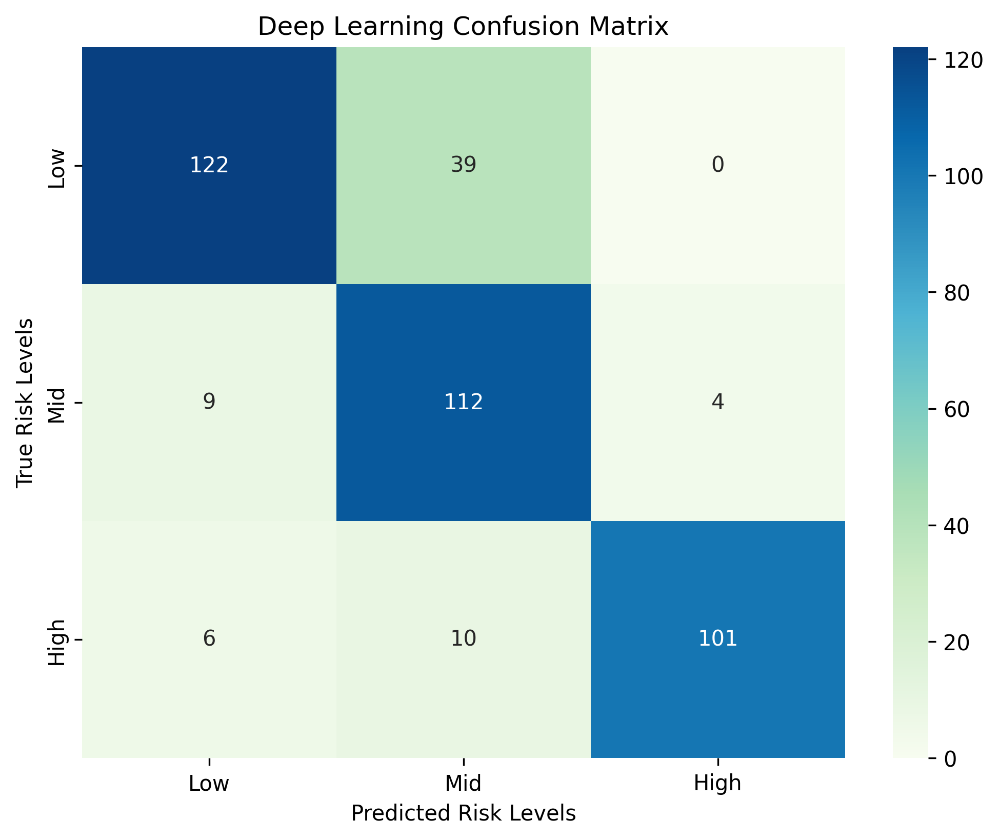

In [ ]:
dl_cm = confusion_matrix(y_test, dl_pred, labels=np.arange(0, 3))

# Plot
plt.figure(figsize=(8, 6))
ax = sns.heatmap(dl_cm, annot=True, cmap="GnBu", fmt='d')
ax.set_xlabel("Predicted Risk Levels")
ax.set_ylabel("True Risk Levels")
ax.set_title("Deep Learning Confusion Matrix")
ax.xaxis.set_ticklabels(["Low", "Mid", "High"])
ax.yaxis.set_ticklabels(["Low", "Mid", "High"])
plt.show()

##Deep Learning Tensorflow 3l

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.20, random_state=1)
# Standardization Z-score
scaler = preprocessing.StandardScaler()
X_trainStandart = scaler.fit_transform(X_train)
X_testStandart = scaler.transform(X_test)

# Create Model for GridSearchCV with Dense layers
def create_model(neurons_1, neurons_2, epochs=400, activation='relu'):
    model = keras.models.Sequential()
    model.add(keras.layers.Dense(units=neurons_1, input_shape=(X_trainStandart.shape[1],), activation=activation))
    model.add(keras.layers.Dropout(rate=0.2))
    model.add(keras.layers.Dense(units=neurons_2, activation=activation))
    model.add(keras.layers.Dropout(rate=0.2))
    model.add(keras.layers.Dense(units=3, activation='linear'))
    model.compile(optimizer=tf.keras.optimizers.Adam(0.01), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
    early_stopping = EarlyStopping(monitor='loss', patience=3, verbose=1, restore_best_weights=True, mode='min')
    return model

params= dict(neurons_1=[45, 65, 75],
             neurons_2=[15, 25, 35])
# Creation of KerasClassifier wrapper for Scikit-learn
model = KerasClassifier(build_fn=create_model, neurons_1=[45, 65, 75], neurons_2=[15, 25, 35], epochs=400)
gs = GridSearchCV(estimator=model, param_grid=params, scoring='accuracy', cv=3)
gs_results = gs.fit(X_trainStandart, y_train)
print(gs_results.best_score_, gs_results.best_params_)

Output streaming troncato alle ultime 5000 righe.
40/40 [==============================] - 0s 3ms/step - loss: 0.3515 - accuracy: 0.8200
Epoch 305/400
40/40 [==============================] - 0s 3ms/step - loss: 0.3584 - accuracy: 0.8271
Epoch 306/400
40/40 [==============================] - 0s 3ms/step - loss: 0.3507 - accuracy: 0.8365
Epoch 307/400
40/40 [==============================] - 0s 4ms/step - loss: 0.3458 - accuracy: 0.8404
Epoch 308/400
40/40 [==============================] - 0s 4ms/step - loss: 0.3563 - accuracy: 0.8326
Epoch 309/400
40/40 [==============================] - 0s 4ms/step - loss: 0.3740 - accuracy: 0.8067
Epoch 310/400
40/40 [==============================] - 0s 3ms/step - loss: 0.3839 - accuracy: 0.8036
Epoch 311/400
40/40 [==============================] - 0s 3ms/step - loss: 0.3691 - accuracy: 0.8044
Epoch 312/400
40/40 [==============================] - 0s 4ms/step - loss: 0.4099 - accuracy: 0.7942
Epoch 313/400
40/40 [==============================] - 

In [ ]:
# Model creation
best_model = gs_results.best_estimator_.model_
best_model.summary()

Model: "sequential_221"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_745 (Dense)           (None, 75)                525       
                                                                 
 dropout_524 (Dropout)       (None, 75)                0         
                                                                 
 dense_746 (Dense)           (None, 35)                2660      
                                                                 
 dropout_525 (Dropout)       (None, 35)                0         
                                                                 
 dense_747 (Dense)           (None, 3)                 108       
                                                                 
Total params: 3293 (12.86 KB)
Trainable params: 3293 (12.86 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch 1/400
48/48 [==============================] - 1s 11ms/step - loss: 0.3534 - accuracy: 0.8343 - val_loss: 0.3171 - val_accuracy: 0.8464
Epoch 2/400
48/48 [==============================] - 0s 7ms/step - loss: 0.3656 - accuracy: 0.8154 - val_loss: 0.3121 - val_accuracy: 0.8464
Epoch 3/400
48/48 [==============================] - 0s 7ms/step - loss: 0.3673 - accuracy: 0.8232 - val_loss: 0.3010 - val_accuracy: 0.8750
Epoch 4/400
48/48 [==============================] - 0s 7ms/step - loss: 0.3574 - accuracy: 0.8350 - val_loss: 0.3019 - val_accuracy: 0.8464
Epoch 5/400
48/48 [==============================] - 0s 7ms/step - loss: 0.3424 - accuracy: 0.8350 - val_loss: 0.3115 - val_accuracy: 0.8594
Epoch 6/400
48/48 [==============================] - 0s 7ms/step - loss: 0.3794 - accuracy: 0.8121 - val_loss: 0.3146 - val_accuracy: 0.8411
Epoch 7/400
48/48 [==============================] - 0s 6ms/step - loss: 0.3515 - accuracy: 0.8317 - val_loss: 0.2917 - val_accuracy: 0.8620
Epoch 8/400


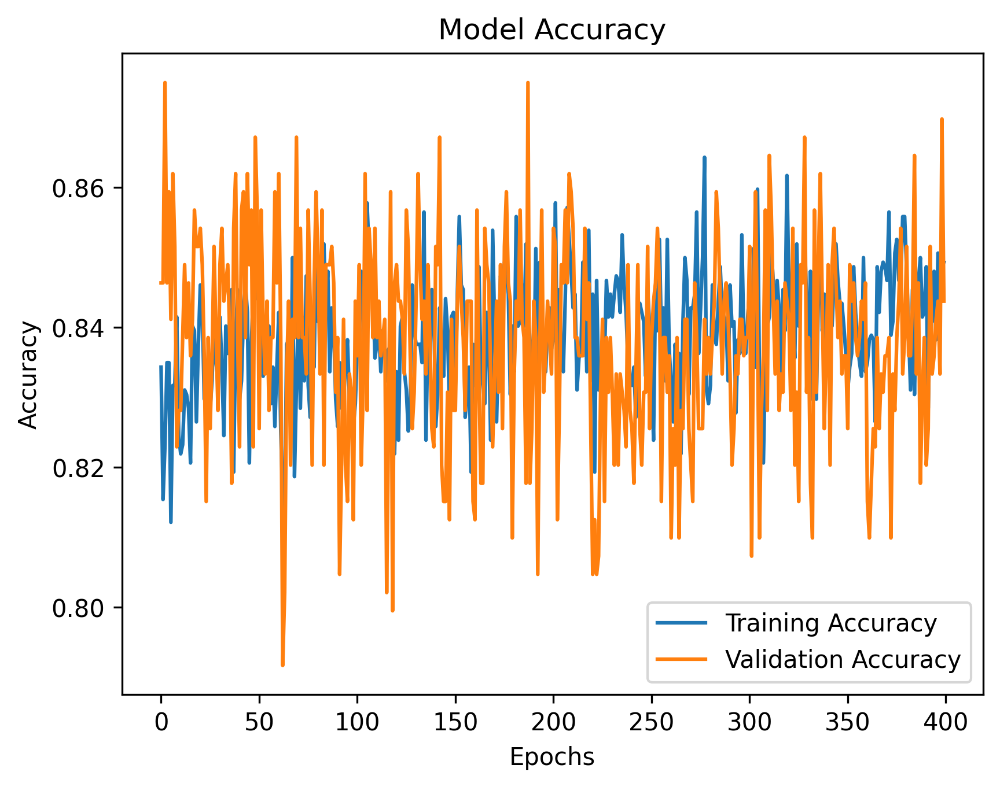

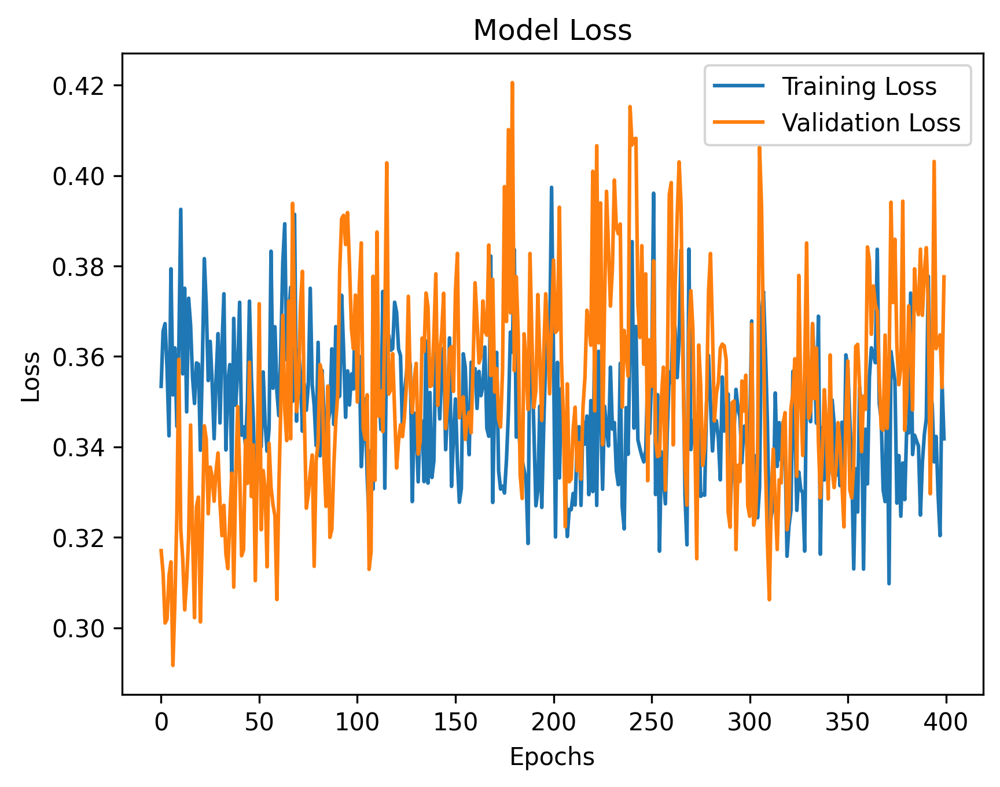

In [ ]:
# Example of model training and history recovery
history = best_model.fit(X_trainStandart, y_train, validation_split=0.20, epochs=400, verbose=1)

# Plot of accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.rcParams['figure.dpi'] = 300
plt.show()

# Plot of loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.rcParams['figure.dpi'] = 300
plt.show()

In [ ]:
# Calculate accuracy for each set
dl_acc_tr = best_model.evaluate(X_trainStandart, y_train)[1]
print("Deep Learning Training Accuracy:", dl_acc_tr)
dl_acc = best_model.evaluate(X_testStandart, y_test)[1]
print("Deep Learning Model Accuracy:", dl_acc)

60/60 [==============================] - 0s 3ms/step - loss: 0.2837 - accuracy: 0.8758
Deep Learning Training Accuracy: 0.8758476972579956
15/15 [==============================] - 0s 2ms/step - loss: 0.3015 - accuracy: 0.8687
Deep Learning Model Accuracy: 0.8687499761581421


In [ ]:
# Predictions as score
dl_pred_logits = best_model.predict(X_testStandart)
print(f"two example output vectors:\n {dl_pred_logits[:2]}")
print("largest value", np.max(dl_pred_logits), "smallest value", np.min(dl_pred_logits))

15/15 [==============================] - 0s 2ms/step
two example output vectors:
 [[  0.34955597   4.9998097  -20.184404  ]
 [ -9.635597     2.4493692    3.2448258 ]]
largest value 365.69122 smallest value -594.7771


In [ ]:
# Predictions as probability
dl_pred_prob = tf.nn.softmax(dl_pred_logits).numpy()
print(f"two example output vectors:\n {dl_pred_prob[:2]}")
print("largest value", np.max(dl_pred_prob), "smallest value", np.min(dl_pred_prob))

two example output vectors:
 [[9.4686635e-03 9.9053138e-01 1.1442034e-11]
 [1.7551858e-06 3.1099766e-01 6.8900055e-01]]
largest value 0.99999994 smallest value 0.0


In [ ]:
# The most likely class for each output vector
dl_pred = np.argmax(dl_pred_prob, axis=1)

In [ ]:
# Classification Report & Confusion Matrix
print("Deep Learning Classification Report\n\n", classification_report(y_test, dl_pred))

Deep Learning Classification Report

               precision    recall  f1-score   support

           0       0.86      0.82      0.84       158
           1       0.83      0.81      0.82       152
           2       0.92      0.96      0.94       170

    accuracy                           0.87       480
   macro avg       0.87      0.87      0.87       480
weighted avg       0.87      0.87      0.87       480



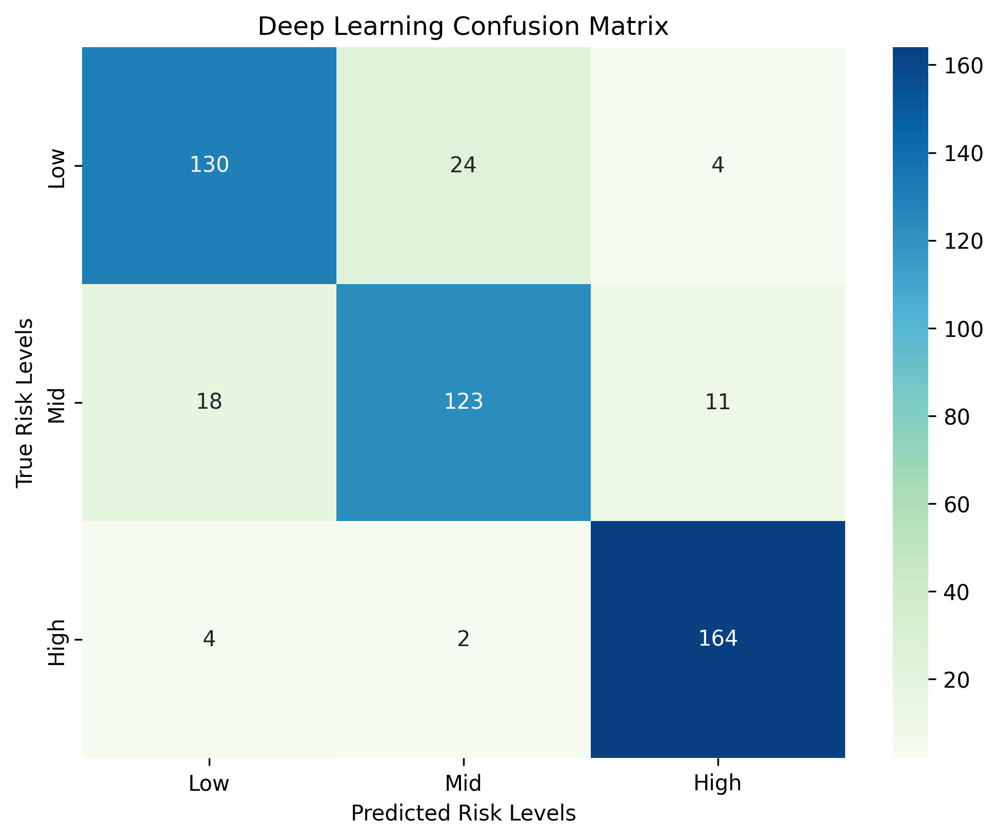

In [ ]:
dl_cm = confusion_matrix(y_test, dl_pred, labels=np.arange(0, 3))

# Plot
plt.figure(figsize=(8, 6))
ax = sns.heatmap(dl_cm, annot=True, cmap="GnBu", fmt='d')
ax.set_xlabel("Predicted Risk Levels")
ax.set_ylabel("True Risk Levels")
ax.set_title("Deep Learning Confusion Matrix")
ax.xaxis.set_ticklabels(["Low", "Mid", "High"])
ax.yaxis.set_ticklabels(["Low", "Mid", "High"])
plt.show()

#Models comparison

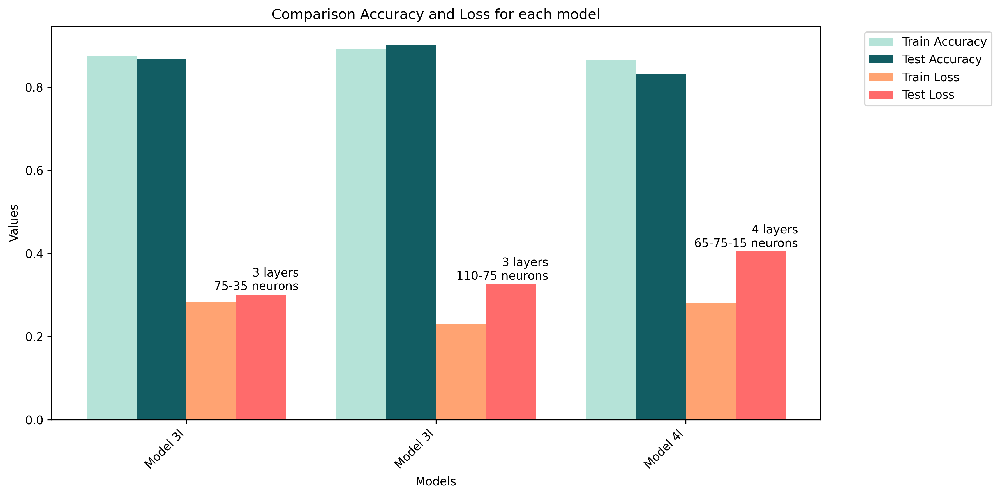

In [ ]:
# Comparison Neural Networks
model_names = ['Model 3l', 'Model 3l', 'Model 4l']
train_accuracies = [0.8758,0.8925,0.8658]
test_accuracies = [0.8687,0.9021,0.8313]
train_losses = [0.2837,0.2304,0.2809]
test_losses = [0.3015,0.3269,0.4052]
num_layers = [3,3,4]
num_neurons = ["75-35","110-75","65-75-15"]

plt.figure(figsize=(12, 6))
plt.bar(np.arange(len(model_names)) - 0.3, train_accuracies, 0.2, label="Train Accuracy", color="#b5e3d8")
plt.bar(np.arange(len(model_names)) - 0.1, test_accuracies, 0.2, label="Test Accuracy", color="#125d63")
plt.bar(np.arange(len(model_names)) + 0.1, train_losses, 0.2, label="Train Loss", color="#ffa372")
plt.bar(np.arange(len(model_names)) + 0.3, test_losses, 0.2, label="Test Loss", color="#ff6b6b")
plt.xticks(np.arange(len(model_names)), model_names, rotation=45, ha="right")
plt.xlabel("Models")
plt.ylabel("Values")
plt.title("Comparison Accuracy and Loss for each model")
for i in range(len(model_names)):
    plt.text(i + 0.45, max(train_losses[i], test_losses[i]) + 0.01, f"{num_layers[i]} layers\n{num_neurons[i]} neurons", ha='right', va='baseline')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [ ]:
# Creating comparison lists
metrics = ["Accuracy"]
model_names = ["LogisticRegression", "DeepLearning"]
acc_list = [test_acc_LR, dl_acc]
tr_acc_list = [train_acc_LR, dl_acc_tr]

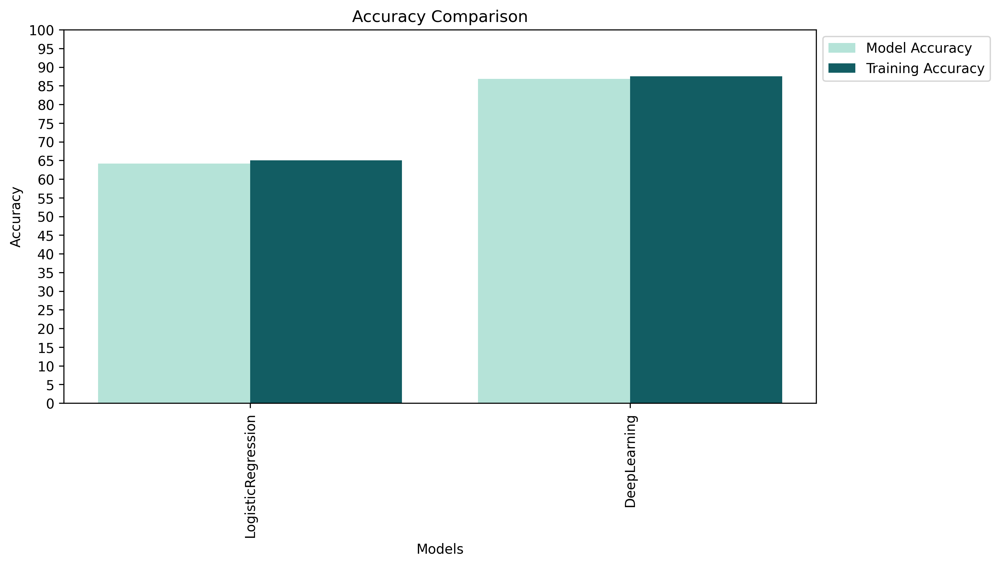

In [ ]:
plt.figure(figsize = (10, 5))

plt.bar(np.arange(len(model_names)) - 0.2,
        np.array(acc_list)*100, 0.4, label = "Model Accuracy", color = "#b5e3d8")
plt.bar(np.arange(len(model_names)) + 0.2,
        np.array(tr_acc_list)*100, 0.4, label = "Training Accuracy", color = "#125d63")
plt.xticks(np.arange(len(model_names)), model_names, rotation = 90)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Accuracy Comparison")
plt.yticks(np.arange(0, 105, 5))
plt.legend(bbox_to_anchor = (1, 1), loc = "best")
plt.show()

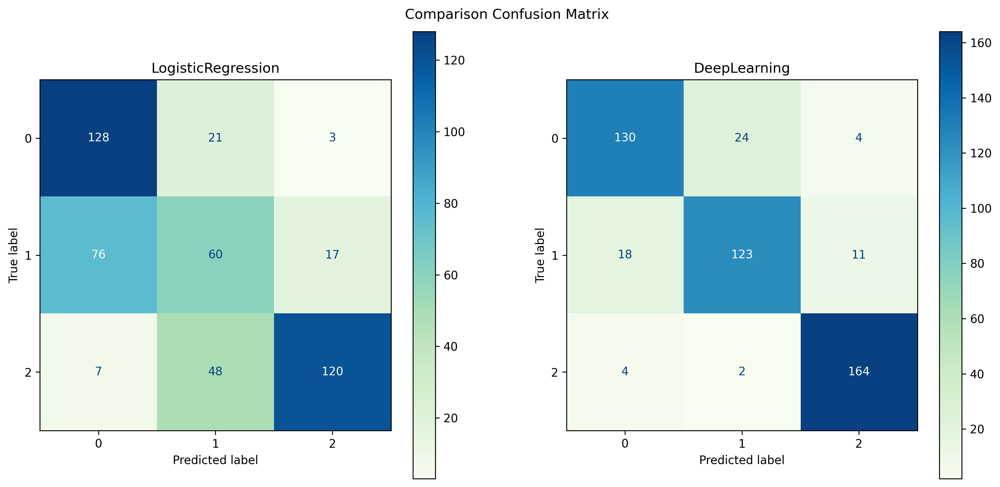

In [ ]:
disp1 = ConfusionMatrixDisplay(confusion_matrix=lr_cm, display_labels=np.arange(0, 3))
disp2 = ConfusionMatrixDisplay(confusion_matrix=dl_cm, display_labels=np.arange(0, 3))
fig, axes = plt.subplots(1, 2, figsize=(15, 7))
axes[0].set_title(model_names[0])
disp1.plot(include_values=True, cmap="GnBu", ax=axes[0])
axes[1].set_title(model_names[1])
disp2.plot(include_values=True, cmap="GnBu", ax=axes[1])
fig.suptitle("Comparison Confusion Matrix", y=0.92)

plt.show()


Come si può vedere dalle matrici di confusione, la Logistic Regression prevede un livello di rischio basso più correttamente, mentre il Deep Learning quelli di rischio medio e alto. Poiché si tratta di un set di dati medici, le previsioni più importanti per noi sono di alto livello di rischio.